<a href="https://colab.research.google.com/github/Dynamixmoses/Dynamixmoses/blob/main/Okesola_Moses_Olusola1_Stock_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Unsupervised Learning: Trade & Ahead

## Problem Statement

### Context

The stock market has consistently proven to be a good place to invest in and save for the future. There are a lot of compelling reasons to invest in stocks. It can help in fighting inflation, create wealth, and also provides some tax benefits. Good steady returns on investments over a long period of time can also grow a lot more than seems possible. Also, thanks to the power of compound interest, the earlier one starts investing, the larger the corpus one can have for retirement. Overall, investing in stocks can help meet life's financial aspirations.

It is important to maintain a diversified portfolio when investing in stocks in order to maximise earnings under any market condition. Having a diversified portfolio tends to yield higher returns and face lower risk by tempering potential losses when the market is down. It is often easy to get lost in a sea of financial metrics to analyze while determining the worth of a stock, and doing the same for a multitude of stocks to identify the right picks for an individual can be a tedious task. By doing a cluster analysis, one can identify stocks that exhibit similar characteristics and ones which exhibit minimum correlation. This will help investors better analyze stocks across different market segments and help protect against risks that could make the portfolio vulnerable to losses.


### Objective

Trade&Ahead is a financial consultancy firm who provide their customers with personalized investment strategies. They have hired you as a Data Scientist and provided you with data comprising stock price and some financial indicators for a few companies listed under the New York Stock Exchange. They have assigned you the tasks of analyzing the data, grouping the stocks based on the attributes provided, and sharing insights about the characteristics of each group.

### Data Dictionary

- Ticker Symbol: An abbreviation used to uniquely identify publicly traded shares of a particular stock on a particular stock market
- Company: Name of the company
- GICS Sector: The specific economic sector assigned to a company by the Global Industry Classification Standard (GICS) that best defines its business operations
- GICS Sub Industry: The specific sub-industry group assigned to a company by the Global Industry Classification Standard (GICS) that best defines its business operations
- Current Price: Current stock price in dollars
- Price Change: Percentage change in the stock price in 13 weeks
- Volatility: Standard deviation of the stock price over the past 13 weeks
- ROE: A measure of financial performance calculated by dividing net income by shareholders' equity (shareholders' equity is equal to a company's assets minus its debt)
- Cash Ratio: The ratio of a  company's total reserves of cash and cash equivalents to its total current liabilities
- Net Cash Flow: The difference between a company's cash inflows and outflows (in dollars)
- Net Income: Revenues minus expenses, interest, and taxes (in dollars)
- Earnings Per Share: Company's net profit divided by the number of common shares it has outstanding (in dollars)
- Estimated Shares Outstanding: Company's stock currently held by all its shareholders
- P/E Ratio: Ratio of the company's current stock price to the earnings per share
- P/B Ratio: Ratio of the company's stock price per share by its book value per share (book value of a company is the net difference between that company's total assets and total liabilities)

## Importing necessary libraries

In [ ]:
# Installing the libraries with the specified version.
# uncomment and run the following line if Google Colab is being used
# !pip install scikit-learn==1.2.2 seaborn==0.13.1 matplotlib==3.7.1 numpy==1.25.2 pandas==1.5.3 yellowbrick==1.5 -q --user

In [ ]:
! "C:\Users\Moses Okesola\anaconda3\python.exe" -m pip install --upgrade pip

In [ ]:
! pip install scikit-learn==1.2.2 seaborn==0.13.1 matplotlib==3.7.1 numpy==1.25.2 pandas==1.5.2 yellowbrick==1.5 --user

! pip install --upgrade jinja2 gensim --user

**Note**: *After running the above cell, kindly restart the notebook kernel and run all cells sequentially from the start again.*

In [ ]:
# Libraries to help with reading and manipulating data
import numpy as np
import pandas as pd

# Libraries to help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_theme(style='darkgrid')

# Removes the limit for the number of displayed columns
pd.set_option("display.max_columns", None)
# Sets the limit for the number of displayed rows
pd.set_option("display.max_rows", 200)

# to scale the data using z-score
from sklearn.preprocessing import StandardScaler

# to compute distances
from scipy.spatial.distance import cdist, pdist

# to perform k-means clustering and compute silhouette scores
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# to visualize the elbow curve and silhouette scores
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer

# to perform hierarchical clustering, compute cophenetic correlation, and create dendrograms
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage, cophenet

# to suppress warnings
import warnings
warnings.filterwarnings("ignore")

## Loading the dataset

In [ ]:
## Complete the code to import the data
data = pd.read_csv('stock_data.csv')

## Overview of the Dataset

**Check the first five rows of the Dataset**

In [ ]:
(data.head()).T

,0,1,2,3,4
Ticker Symbol,AAL,ABBV,ABT,ADBE,ADI
Security,American Airlines Group,AbbVie,Abbott Laboratories,Adobe Systems Inc,"Analog Devices, Inc."
GICS Sector,Industrials,Health Care,Health Care,Information Technology,Information Technology
GICS Sub Industry,Airlines,Pharmaceuticals,Health Care Equipment,Application Software,Semiconductors
Current Price,42.349998,59.240002,44.91,93.940002,55.32
Price Change,9.999995,8.339433,11.301121,13.977195,-1.827858
Volatility,1.687151,2.197887,1.273646,1.357679,1.701169
ROE,135,130,21,9,14
Cash Ratio,51,77,67,180,272
Net Cash Flow,-604000000,51000000,938000000,-240840000,315120000


**Check the last five rows of the Dataset**

In [ ]:
(data.tail()).T

,335,336,337,338,339
Ticker Symbol,YHOO,YUM,ZBH,ZION,ZTS
Security,Yahoo Inc.,Yum! Brands Inc,Zimmer Biomet Holdings,Zions Bancorp,Zoetis
GICS Sector,Information Technology,Consumer Discretionary,Health Care,Financials,Health Care
GICS Sub Industry,Internet Software & Services,Restaurants,Health Care Equipment,Regional Banks,Pharmaceuticals
Current Price,33.259998,52.516175,102.589996,27.299999,47.919998
Price Change,14.887727,-8.698917,9.347683,-1.158588,16.678836
Volatility,1.845149,1.478877,1.404206,1.468176,1.610285
ROE,15,142,1,4,32
Cash Ratio,459,27,100,99,65
Net Cash Flow,-1032187000,159000000,376000000,-43623000,272000000


### Checking the shape of the dataset

In [ ]:
# Checking shape of the data
data.shape

(340, 15)

*There are 340 rows and 15 columns in the dataset.

### Checking the data types of the columns for the dataset

In [ ]:
# checking the column names and datatypes
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 340 entries, 0 to 339
Data columns (total 15 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Ticker Symbol                 340 non-null    object 
 1   Security                      340 non-null    object 
 2   GICS Sector                   340 non-null    object 
 3   GICS Sub Industry             340 non-null    object 
 4   Current Price                 340 non-null    float64
 5   Price Change                  340 non-null    float64
 6   Volatility                    340 non-null    float64
 7   ROE                           340 non-null    int64  
 8   Cash Ratio                    340 non-null    int64  
 9   Net Cash Flow                 340 non-null    int64  
 10  Net Income                    340 non-null    int64  
 11  Earnings Per Share            340 non-null    float64
 12  Estimated Shares Outstanding  340 non-null    float64
 13  P/E R

### Creating a copy of original data

In [ ]:
# copying the data to another variable to avoid any changes to original data
df = data.copy()

### Checking for duplicates and missing values

In [ ]:
# checking for duplicate values
df.duplicated().sum() ## the code to get total number of duplicate values

0

In [ ]:
# checking for missing values in the data
df.isnull().sum() ## the code to check the missing values in the data

Ticker Symbol                   0
Security                        0
GICS Sector                     0
GICS Sub Industry               0
Current Price                   0
Price Change                    0
Volatility                      0
ROE                             0
Cash Ratio                      0
Net Cash Flow                   0
Net Income                      0
Earnings Per Share              0
Estimated Shares Outstanding    0
P/E Ratio                       0
P/B Ratio                       0
dtype: int64

**Drop unique identifier 'Ticker Symbol' because it does not carry intrinsic information about the data points**

In [ ]:
# Dropping the 'Customer_ID' column
df = df.drop(columns=['Ticker Symbol'])

### Statistical summary of the dataset

**Let's check the statistical summary of the data.**

In [ ]:
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Security,340,340,American Airlines Group,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GICS Sector,340,11,Industrials,53,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GICS Sub Industry,340,104,Oil & Gas Exploration & Production,16,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Current Price,340.0,NaN,NaN,NaN,80.862345,98.055086,4.5,38.555,59.705,92.880001,1274.949951
Price Change,340.0,NaN,NaN,NaN,4.078194,12.006338,-47.129693,-0.939484,4.819505,10.695493,55.051683
Volatility,340.0,NaN,NaN,NaN,1.525976,0.591798,0.733163,1.134878,1.385593,1.695549,4.580042
ROE,340.0,NaN,NaN,NaN,39.597059,96.547538,1.0,9.75,15.0,27.0,917.0
Cash Ratio,340.0,NaN,NaN,NaN,70.023529,90.421331,0.0,18.0,47.0,99.0,958.0
Net Cash Flow,340.0,NaN,NaN,NaN,55537620.588235,1946365312.175789,-11208000000.0,-193906500.0,2098000.0,169810750.0,20764000000.0
Net Income,340.0,NaN,NaN,NaN,1494384602.941176,3940150279.327937,-23528000000.0,352301250.0,707336000.0,1899000000.0,24442000000.0


## Exploratory Data Analysis

### Univariate analysis

In [ ]:
df.columns

Index(['Security', 'GICS Sector', 'GICS Sub Industry', 'Current Price',
       'Price Change', 'Volatility', 'ROE', 'Cash Ratio', 'Net Cash Flow',
       'Net Income', 'Earnings Per Share', 'Estimated Shares Outstanding',
       'P/E Ratio', 'P/B Ratio'],
      dtype='object')

In [ ]:
# Extracting numerical columns
num_col = df.select_dtypes(include=['number']).columns
print("Numerical Columns:\n", list(num_col))

Numerical Columns:
 ['Current Price', 'Price Change', 'Volatility', 'ROE', 'Cash Ratio', 'Net Cash Flow', 'Net Income', 'Earnings Per Share', 'Estimated Shares Outstanding', 'P/E Ratio', 'P/B Ratio']


In [ ]:
# Extracting object columns
object_col = df.select_dtypes(include=['object']).columns
print("Object Columns:\n", list(object_col))

Object Columns:
 ['Security', 'GICS Sector', 'GICS Sub Industry']


In [ ]:
# Let's see unique values
cols = df.columns

for col in cols:
    print("Unique values in the column '{}' are \n\n".format(col), df[col].unique())
    print("-" * 100)

Unique values in the column 'Security' are 

 ['American Airlines Group' 'AbbVie' 'Abbott Laboratories'
 'Adobe Systems Inc' 'Analog Devices, Inc.' 'Archer-Daniels-Midland Co'
 'Alliance Data Systems' 'Ameren Corp' 'American Electric Power'
 'AFLAC Inc' 'American International Group, Inc.'
 'Apartment Investment & Mgmt' 'Assurant Inc' 'Arthur J. Gallagher & Co.'
 'Akamai Technologies Inc' 'Albemarle Corp' 'Alaska Air Group Inc'
 'Allstate Corp' 'Allegion' 'Alexion Pharmaceuticals'
 'Applied Materials Inc' 'AMETEK Inc' 'Affiliated Managers Group Inc'
 'Amgen Inc' 'Ameriprise Financial' 'American Tower Corp A'
 'Amazon.com Inc' 'AutoNation Inc' 'Anthem Inc.' 'Aon plc'
 'Apache Corporation' 'Anadarko Petroleum Corp' 'Amphenol Corp'
 'Arconic Inc' 'Activision Blizzard' 'AvalonBay Communities, Inc.'
 'Broadcom' 'American Water Works Company Inc' 'American Express Co'
 'Boeing Company' 'Bank of America Corp' 'Baxter International Inc.'
 'BB&T Corporation' 'Bard (C.R.) Inc.' 'Baker Hughes Inc

In [ ]:
def histogram_boxplot(df, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to the show density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=df, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a star will indicate the mean value of the column
    sns.histplot(
        data=df, x=feature, kde=kde, ax=ax_hist2, bins=bins, color="blue"
    )  # For histogram, with optional density curve (kde) and bin count
    ax_hist2.axvline(
        df[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        df[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

    plt.show()

# Example usage:
# Assuming df is your DataFrame and 'Current Price' is the column you want to plot
# histogram_boxplot(df, 'Current Price', kde=True, bins=20)



In [ ]:
# function to plot a boxplot and a histogram along the same scale.

def histogram_boxplot(df, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to the show density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=df, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a star will indicate the mean value of the column
    sns.histplot(
        data=df, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        data=df, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        df[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        df[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

In [ ]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

**We shall check distribution of numerical variables**

**`Current Price`**

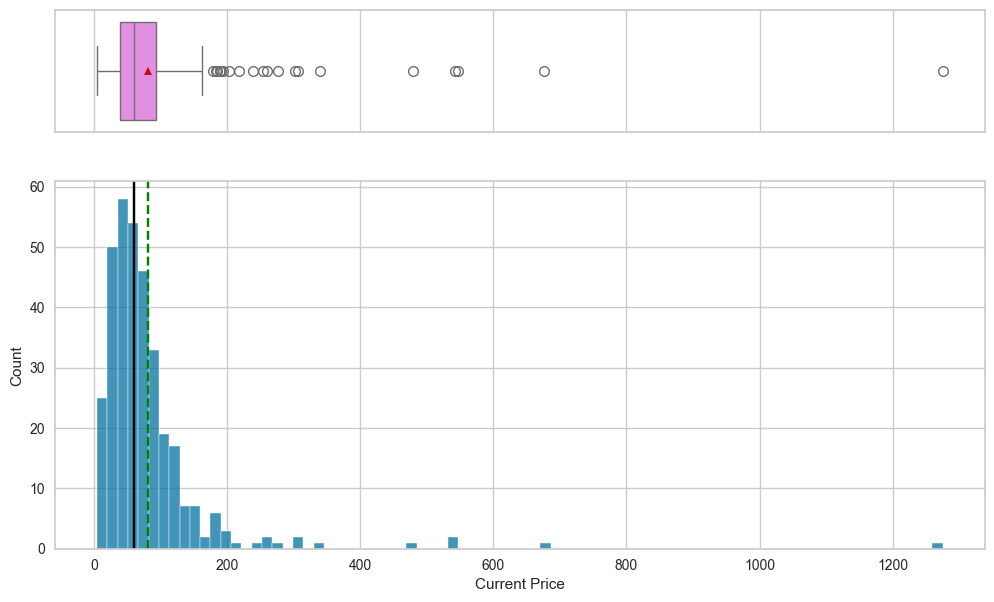

In [ ]:
histogram_boxplot(df, 'Current Price') # create histogram_boxplot for 'Current Price'

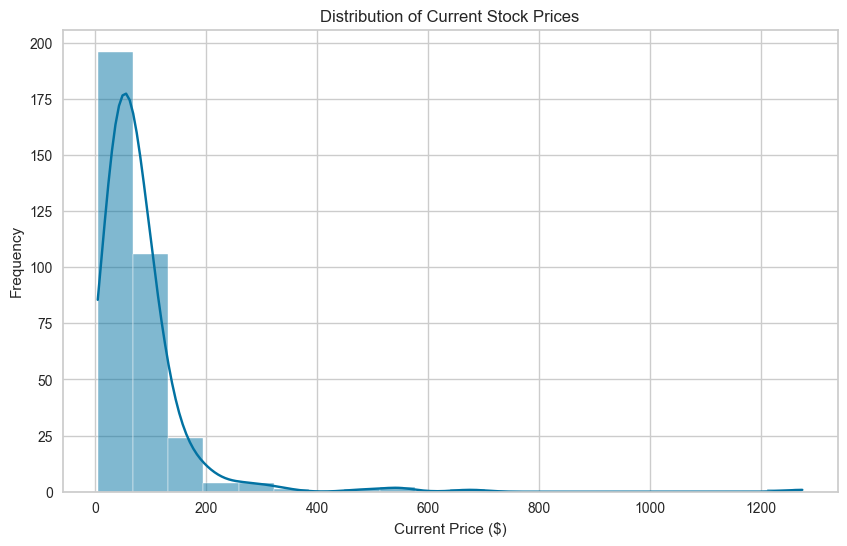

In [ ]:
plt.figure(figsize=(10, 6))
sns.histplot(df['Current Price'], kde=True, bins=20)
plt.title('Distribution of Current Stock Prices')
plt.xlabel('Current Price ($)')
plt.ylabel('Frequency')
plt.show()

**`Price Change`**

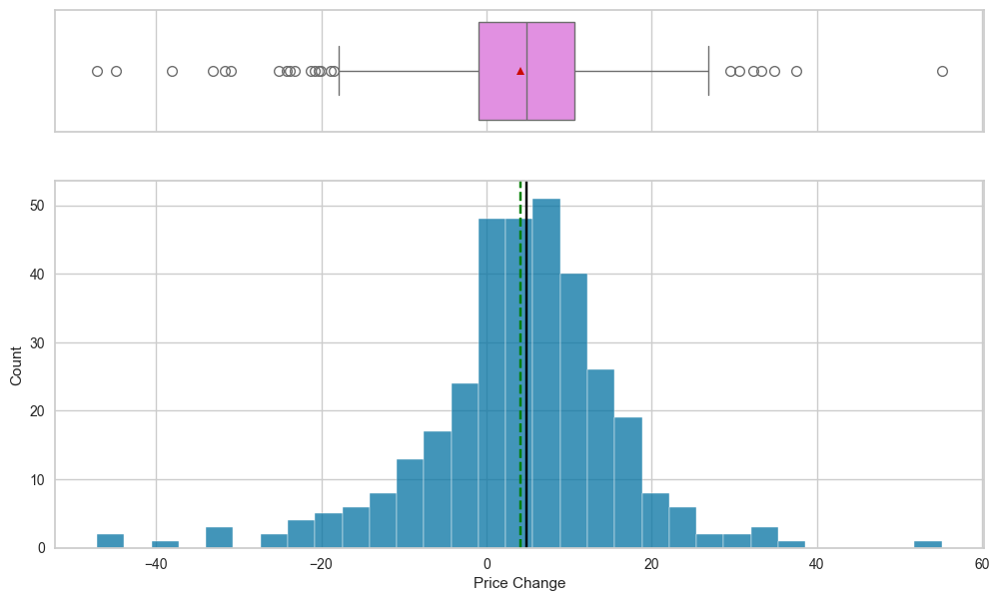

In [ ]:
histogram_boxplot(df, 'Price Change') # create histogram_boxplot for 'Price Change'

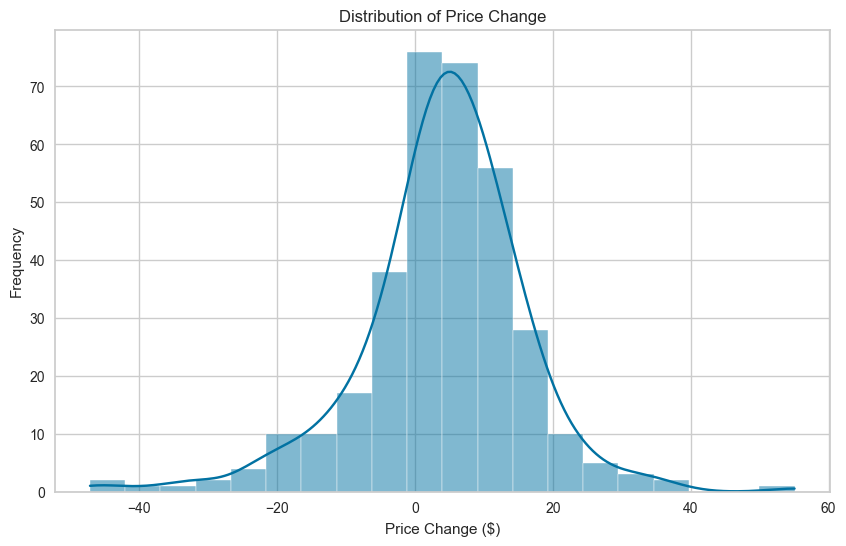

In [ ]:
plt.figure(figsize=(10, 6))
sns.histplot(df['Price Change'], kde=True, bins=20)
plt.title('Distribution of Price Change')
plt.xlabel('Price Change ($)')
plt.ylabel('Frequency')
plt.show()

**`Volatility`**

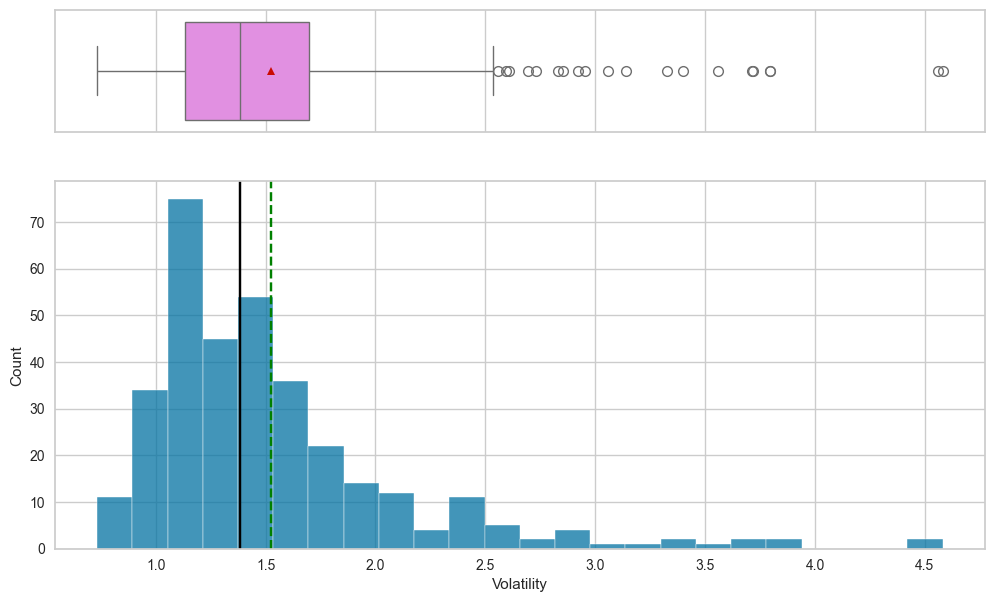

In [ ]:
histogram_boxplot(df,'Volatility')  ## create histogram_boxplot for 'Volatility'

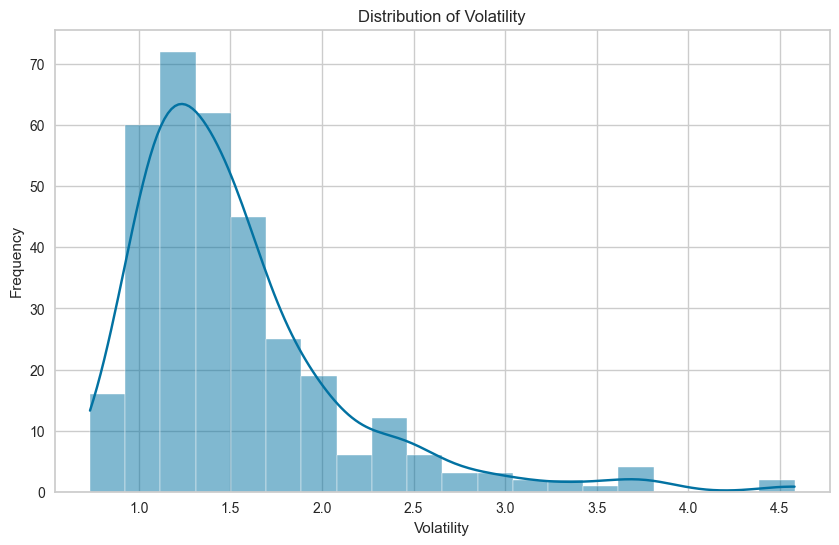

In [ ]:
plt.figure(figsize=(10, 6))
sns.histplot(df['Volatility'], kde=True, bins=20)
plt.title('Distribution of Volatility')
plt.xlabel('Volatility')
plt.ylabel('Frequency')
plt.show()

**`ROE`**

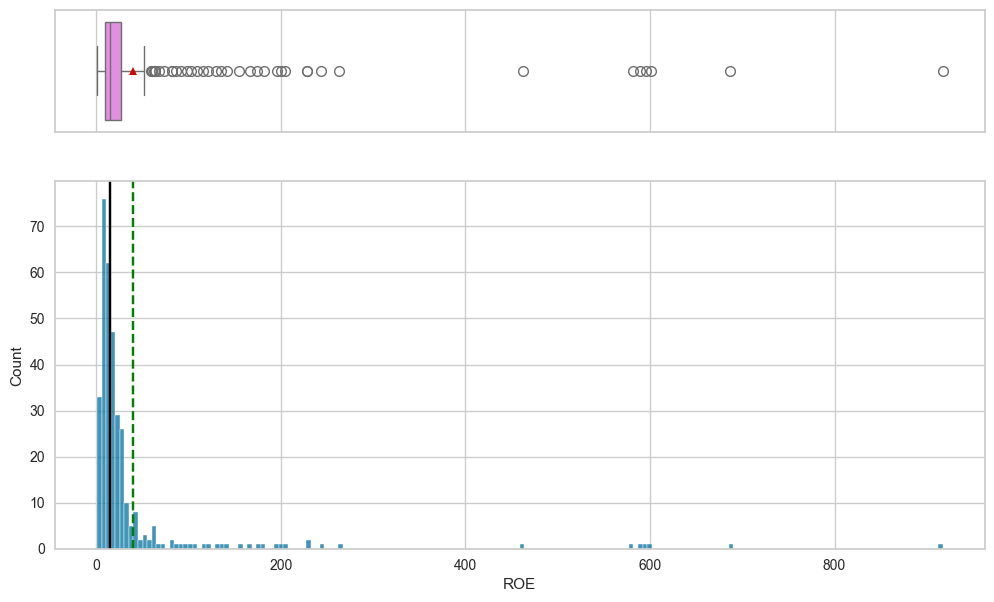

In [ ]:
histogram_boxplot(df, 'ROE')  ## create histogram_boxplot for 'ROE'

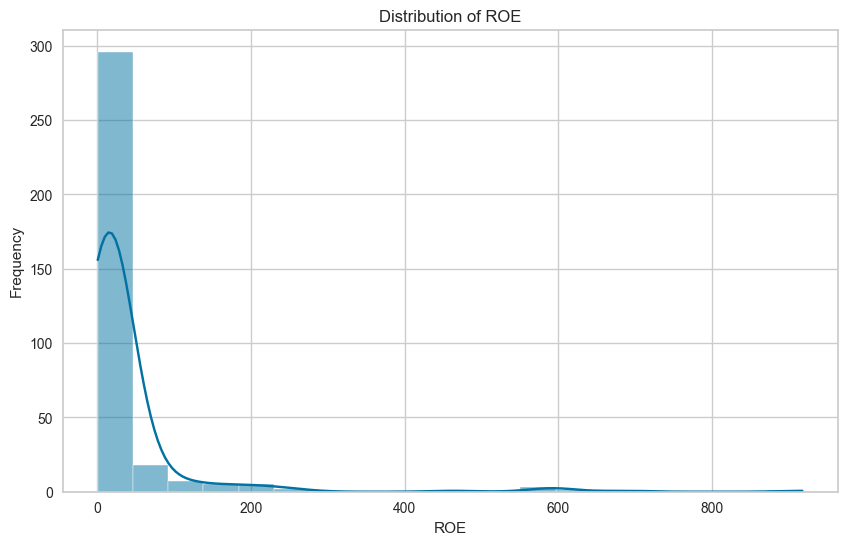

In [ ]:
plt.figure(figsize=(10, 6))
sns.histplot(df['ROE'], kde=True, bins=20)
plt.title('Distribution of ROE')
plt.xlabel('ROE')
plt.ylabel('Frequency')
plt.show()

**`Cash Ratio`**

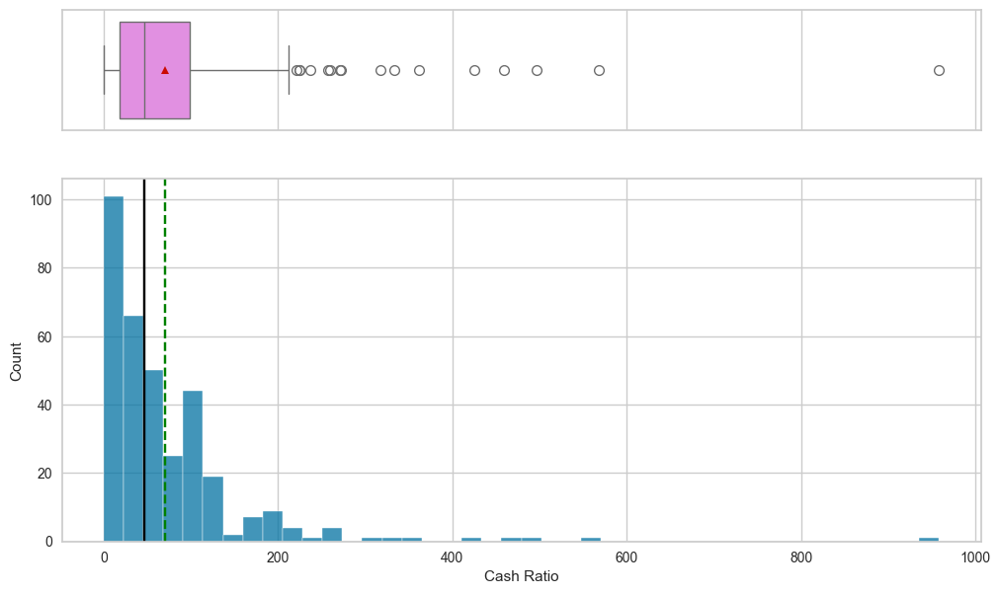

In [ ]:
histogram_boxplot(df, 'Cash Ratio')  ## create histogram_boxplot for 'Cash Ratio'

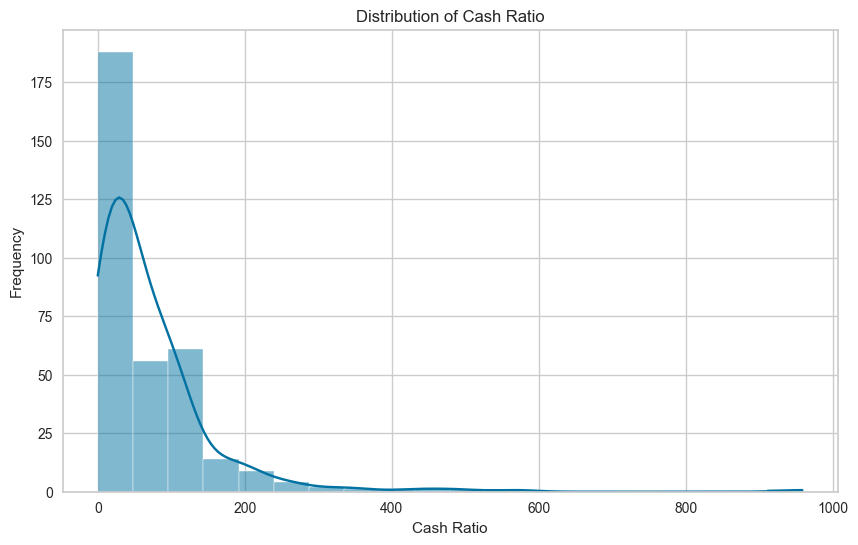

In [ ]:
plt.figure(figsize=(10, 6))
sns.histplot(df['Cash Ratio'], kde=True, bins=20)
plt.title('Distribution of Cash Ratio')
plt.xlabel('Cash Ratio')
plt.ylabel('Frequency')
plt.show()

**`Net Cash Flow`**

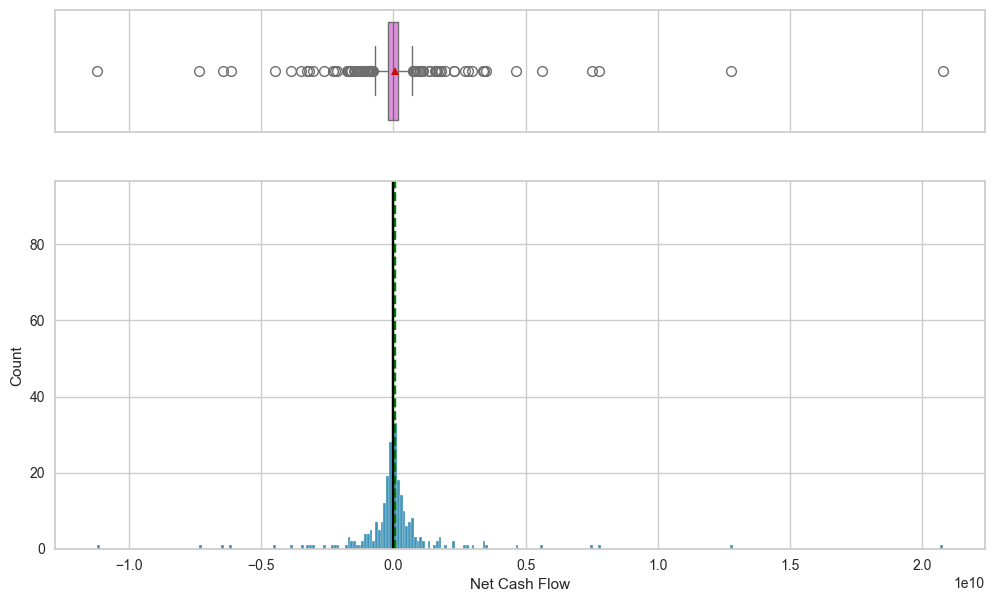

In [ ]:
histogram_boxplot(df, 'Net Cash Flow')  ## create histogram_boxplot for 'Net Cash Flow'

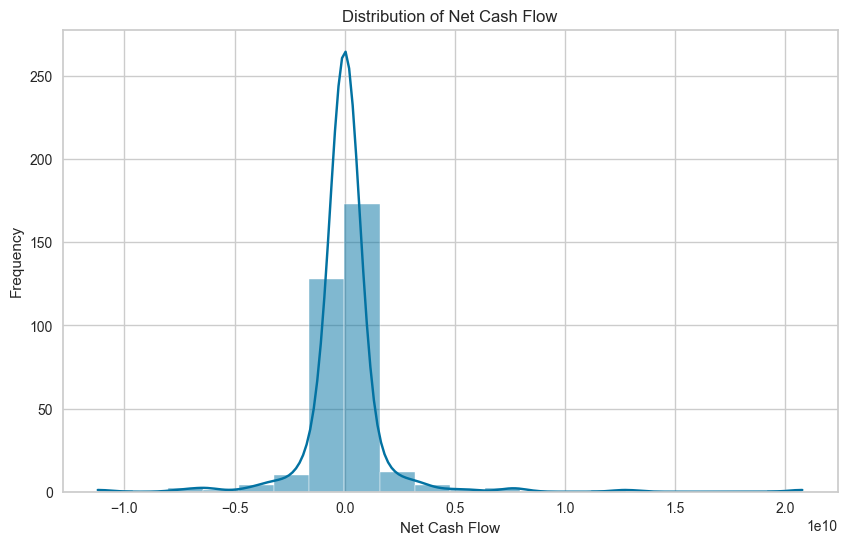

In [ ]:
plt.figure(figsize=(10, 6))
sns.histplot(df['Net Cash Flow'], kde=True, bins=20)
plt.title('Distribution of Net Cash Flow')
plt.xlabel('Net Cash Flow')
plt.ylabel('Frequency')
plt.show()

**`Net Income`**

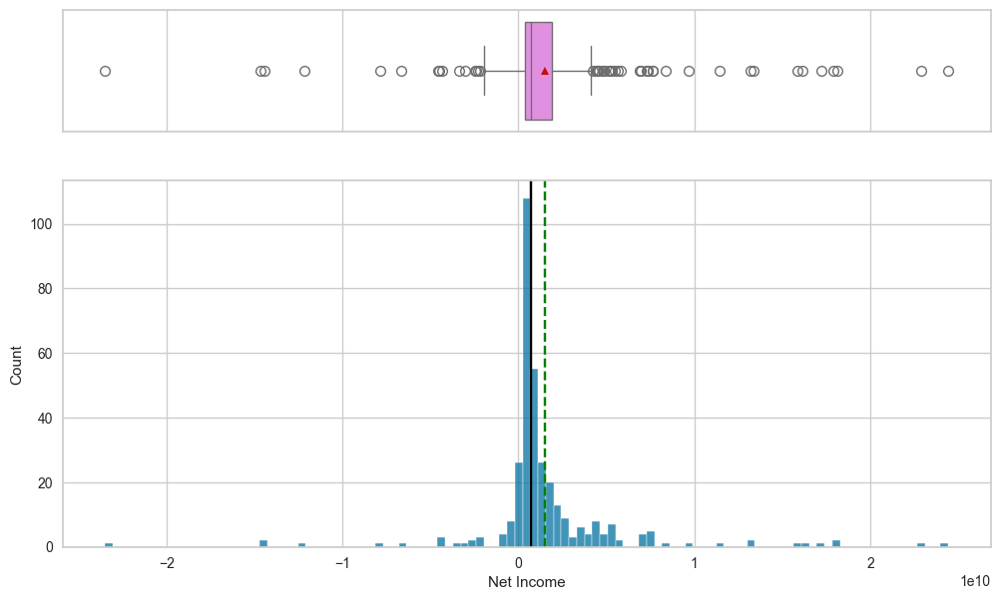

In [ ]:
histogram_boxplot(df, 'Net Income')  ## create histogram_boxplot for 'Net Income'

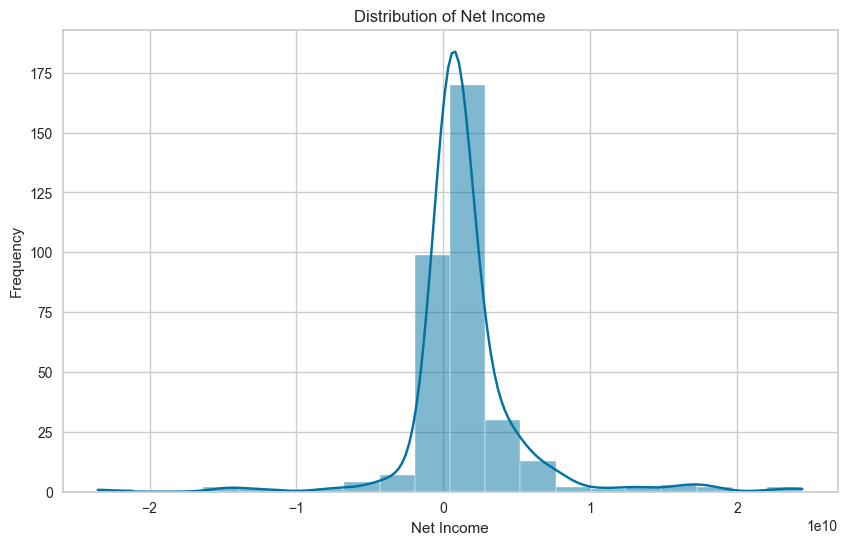

In [ ]:
plt.figure(figsize=(10, 6))
sns.histplot(df['Net Income'], kde=True, bins=20)
plt.title('Distribution of Net Income')
plt.xlabel('Net Income')
plt.ylabel('Frequency')
plt.show()

**`Earnings Per Share`**

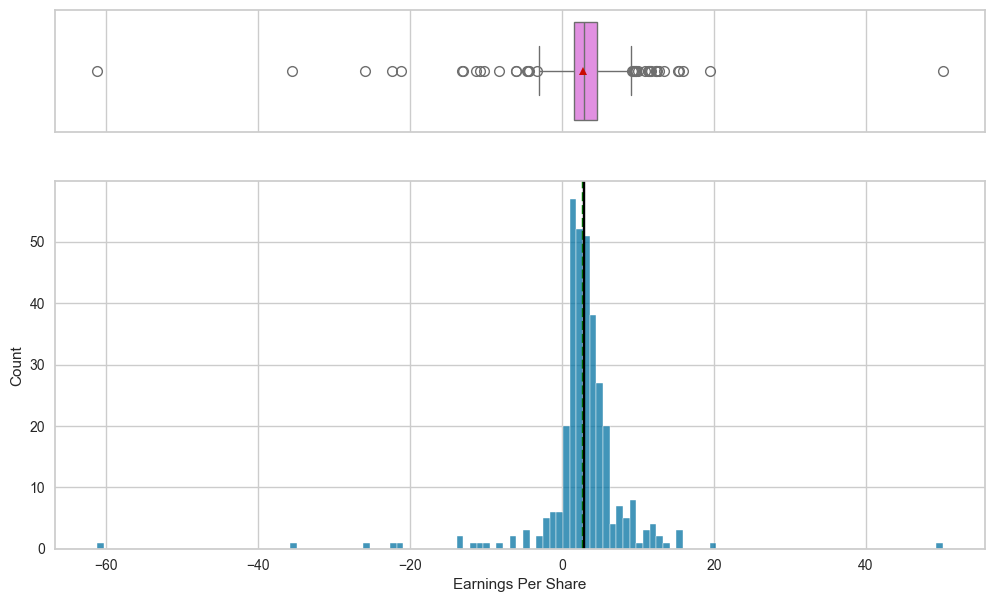

In [ ]:
histogram_boxplot(df, 'Earnings Per Share')  ## create histogram_boxplot for 'Earnings Per Share'

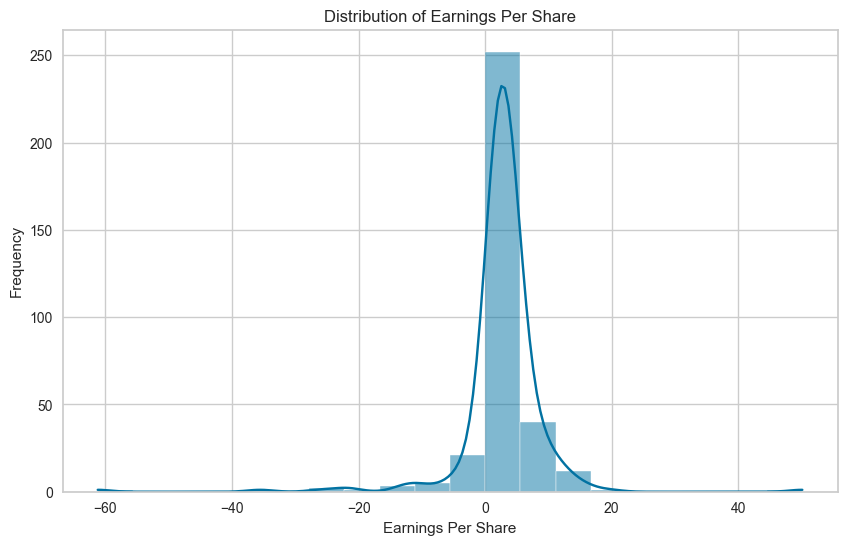

In [ ]:
plt.figure(figsize=(10, 6))
sns.histplot(df['Earnings Per Share'], kde=True, bins=20)
plt.title('Distribution of Earnings Per Share')
plt.xlabel('Earnings Per Share')
plt.ylabel('Frequency')
plt.show()

**`Estimated Shares Outstanding`**

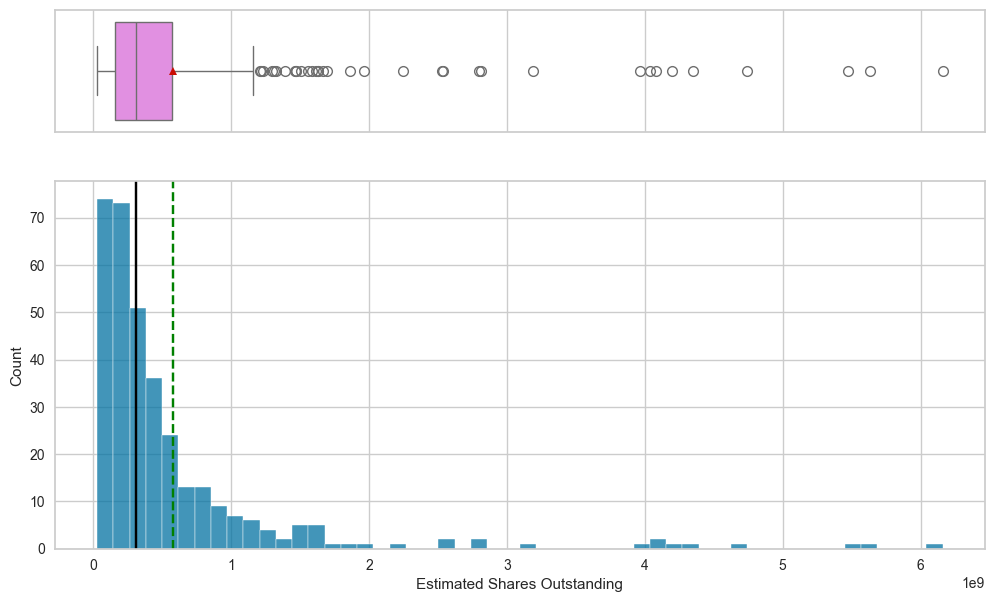

In [ ]:
histogram_boxplot(df,'Estimated Shares Outstanding')  ## create histogram_boxplot for 'Estimated Shares Outstanding'

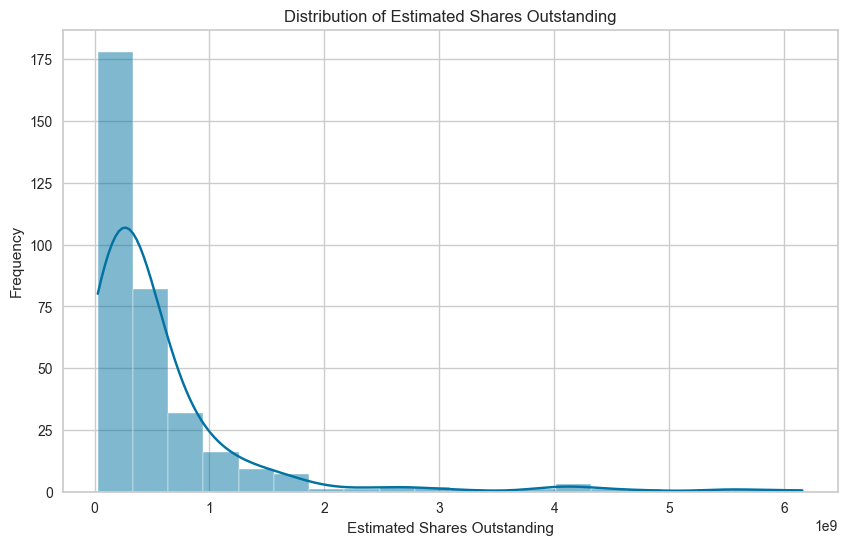

In [ ]:
plt.figure(figsize=(10, 6))
sns.histplot(df['Estimated Shares Outstanding'], kde=True, bins=20)
plt.title('Distribution of Estimated Shares Outstanding')
plt.xlabel('Estimated Shares Outstanding')
plt.ylabel('Frequency')
plt.show()

**`P/E Ratio`**

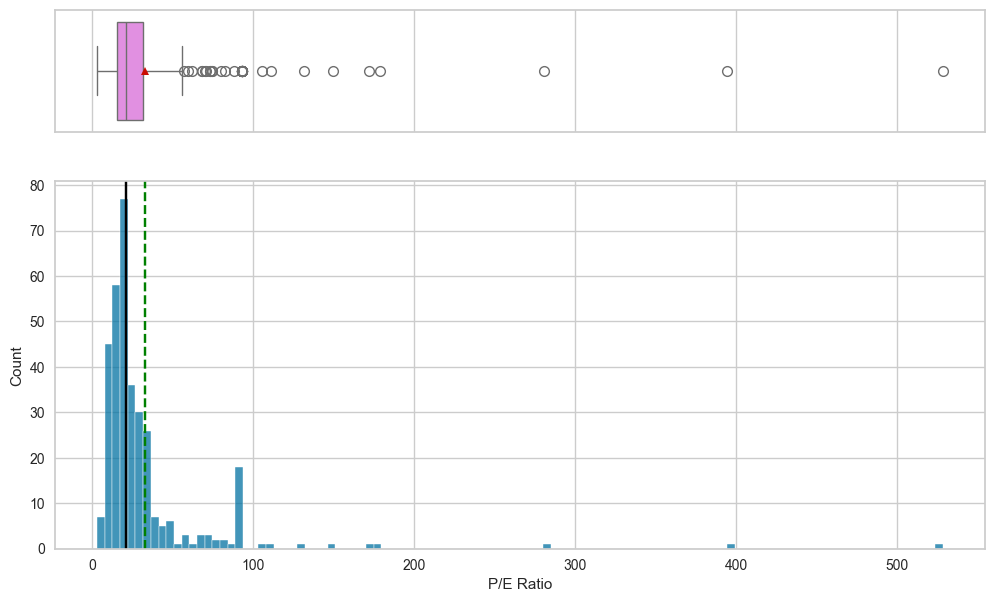

In [ ]:
histogram_boxplot(df, 'P/E Ratio')  ## create histogram_boxplot for 'P/E Ratio'

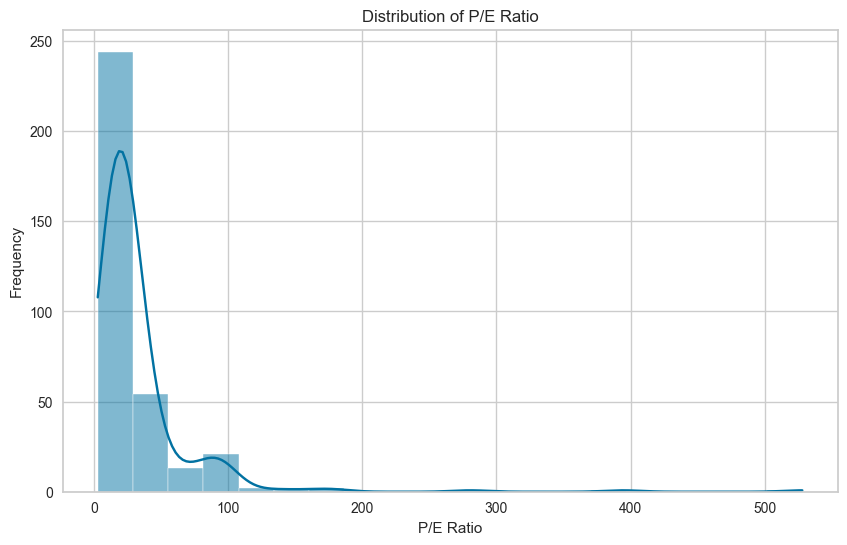

In [ ]:
plt.figure(figsize=(10, 6))
sns.histplot(df['P/E Ratio'], kde=True, bins=20)
plt.title('Distribution of P/E Ratio')
plt.xlabel('P/E Ratio')
plt.ylabel('Frequency')
plt.show()

**`P/B Ratio`**

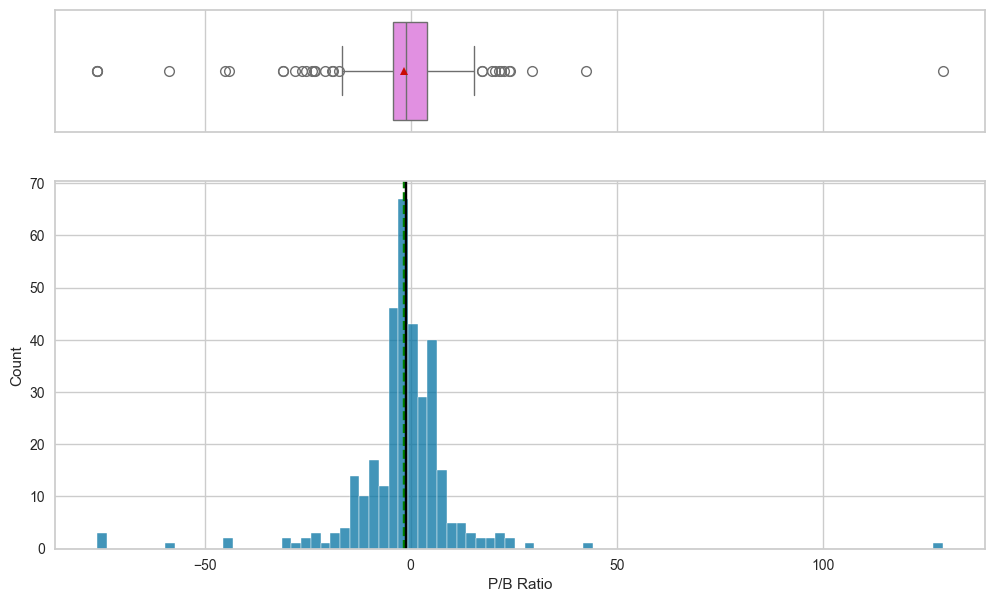

In [ ]:
histogram_boxplot(df, 'P/B Ratio')  ## create histogram_boxplot for 'P/B Ratio'

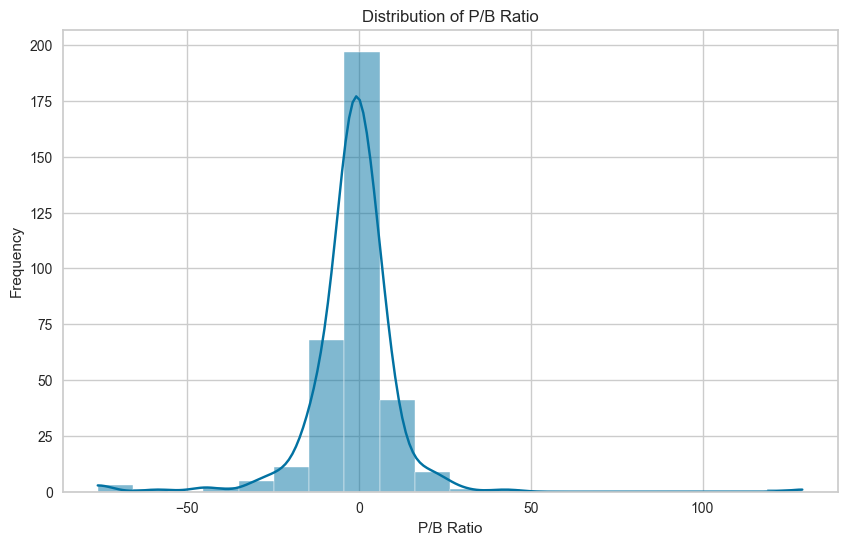

In [ ]:
plt.figure(figsize=(10, 6))
sns.histplot(df['P/B Ratio'], kde=True, bins=20)
plt.title('Distribution of P/B Ratio')
plt.xlabel('P/B Ratio')
plt.ylabel('Frequency')
plt.show()

In [ ]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

**`GICS Sector`**

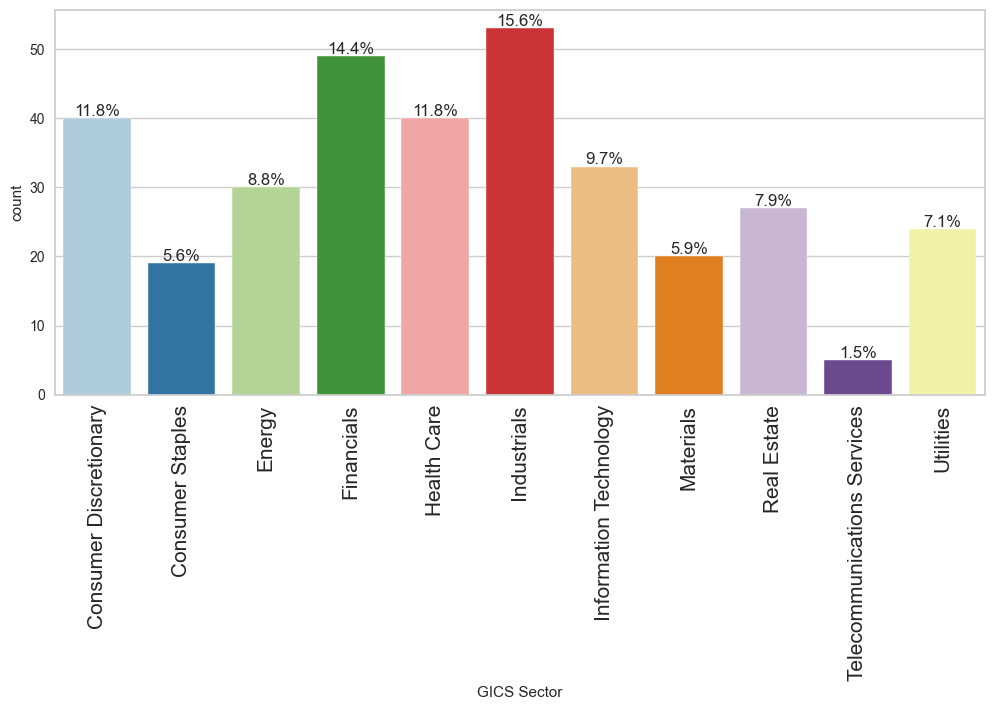

In [ ]:
labeled_barplot(df, 'GICS Sector', perc=True) ## create a labelled barplot for 'GICS Sector'

**`GICS Sub Industry`**

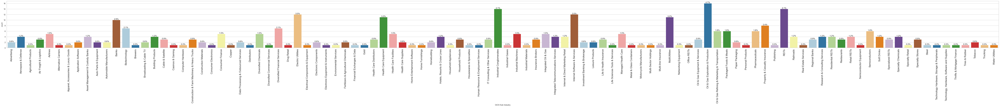

In [ ]:
labeled_barplot(df, 'GICS Sub Industry', perc=True)  ## create a labelled barplot for 'GICS Sub Industry'

**Security**

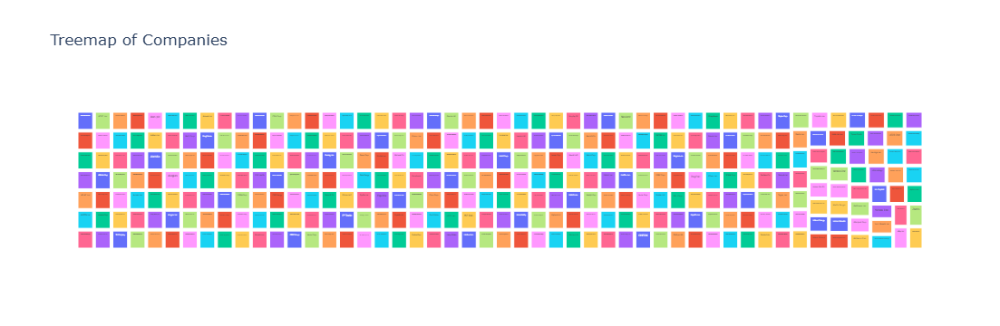

In [ ]:
import plotly.express as px

# Extract the list of companies from the 'Security' column
Security = df['Security'].tolist()  # This converts the 'Security' column to a list

# Assuming 'Category' is a column in your DataFrame that you want to represent with colors
fig = px.treemap(df, path=['Security'], color='Security', title="Treemap of Companies")
fig.show()

### Bivariate Analysis

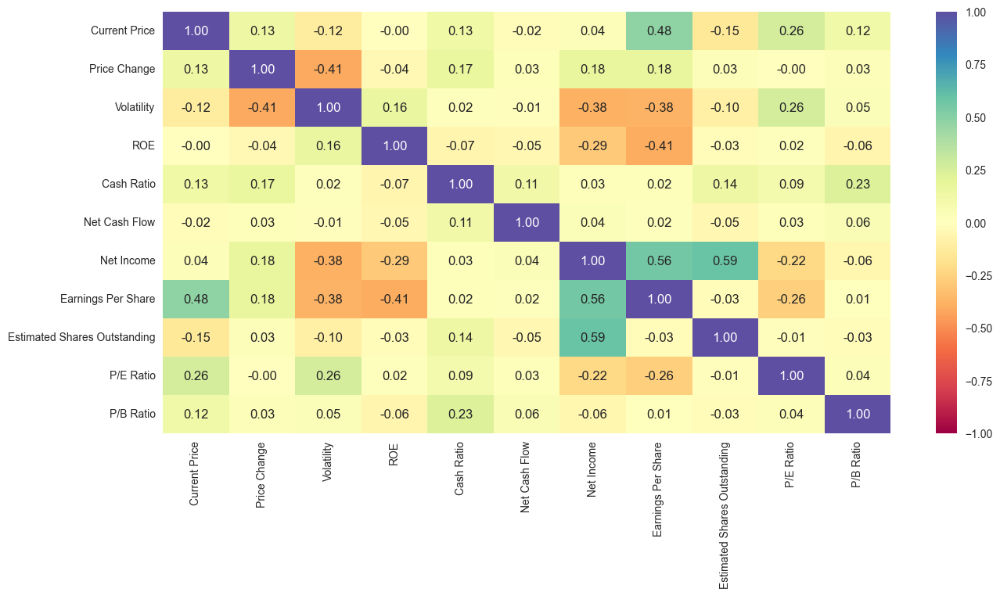

In [ ]:
# correlation check
plt.figure(figsize=(15, 7))
sns.heatmap(
    df.corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral"
)
plt.show()

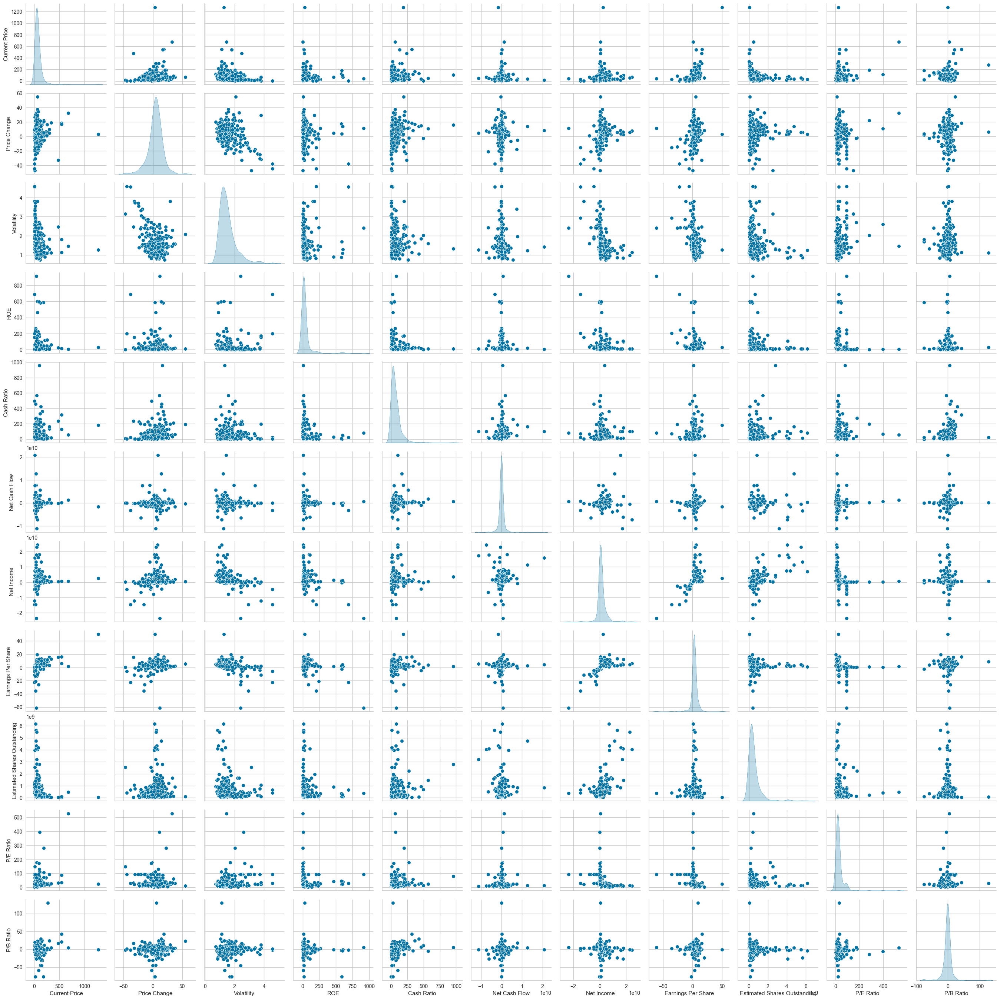

In [ ]:
sns.pairplot(data=df[num_col], diag_kind="kde")
plt.show()

**GICS Sector vs. Price Change**

**Let's check the stocks of which economic sector have seen the maximum price increase on average or Do certain sectors have higher price changes compared to others?**

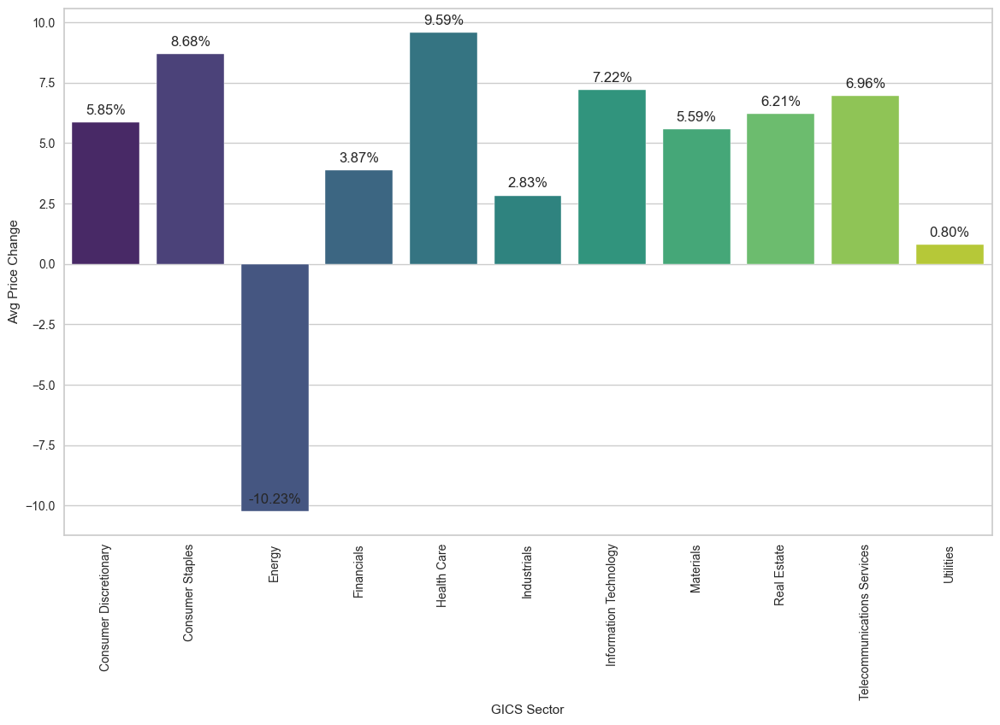

The sector with the maximum average price increase is: Health Care with an average price change of 9.59%.


In [ ]:
# Calculate the average price change by sector
Sector_avg_price_change = df.groupby('GICS Sector')['Price Change'].mean().reset_index()
Sector_avg_price_change.rename(columns={'Price Change': 'Avg Price Change'}, inplace=True)

# Plotting the bar chart
plt.figure(figsize=(14,8))
bar_plot = sns.barplot(data=Sector_avg_price_change, x='GICS Sector', y='Avg Price Change', palette='viridis')

# Annotate the bar plot with the percentage values
for p in bar_plot.patches:
        bar_plot.annotate(f'{p.get_height():.2f}%',
                          (p.get_x() + p.get_width() / 2., p.get_height()),
                          ha='center', va='center',
                          xytext=(0, 10),
                          textcoords='offset points')


plt.xticks(rotation=90)
plt.show()

# Determine the sector with the maximum price increase
max_price_increase_sector = Sector_avg_price_change.loc[Sector_avg_price_change['Avg Price Change'].idxmax()]
print(f"The sector with the maximum average price increase is: {max_price_increase_sector['GICS Sector']} with an average price change of {max_price_increase_sector['Avg Price Change']:.2f}%.")



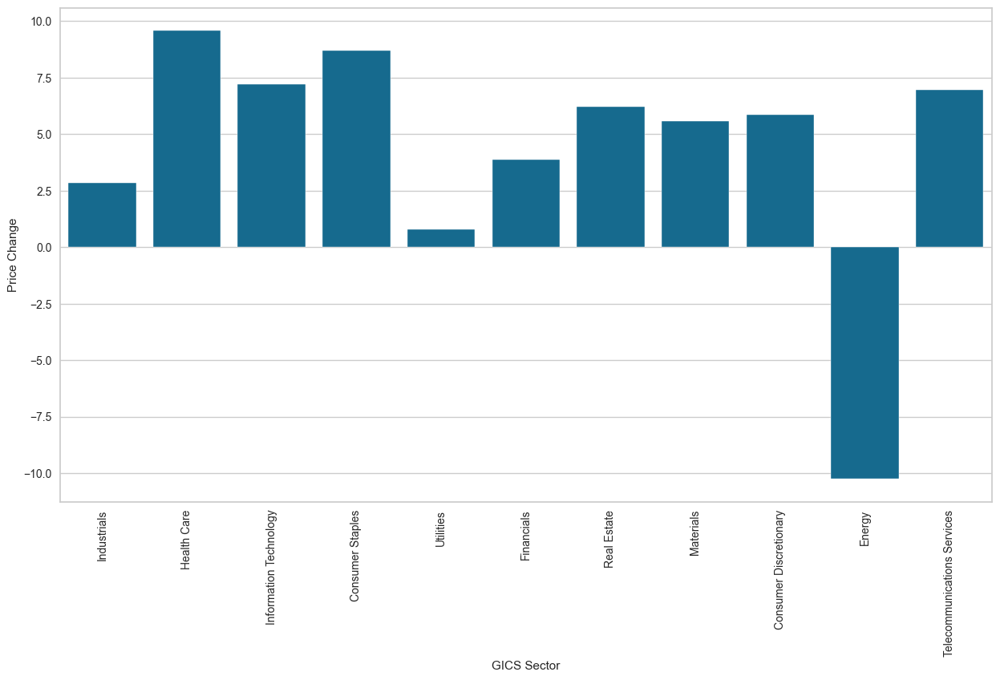

In [ ]:
plt.figure(figsize=(15,8))
sns.barplot(data=df, x='GICS Sector', y='Price Change', ci=False)  ## code to choose the right variables
plt.xticks(rotation=90)
plt.show()

**GICS Sector vs. Current Price**

**Investigate how the current price relates to the GICS Sector.**

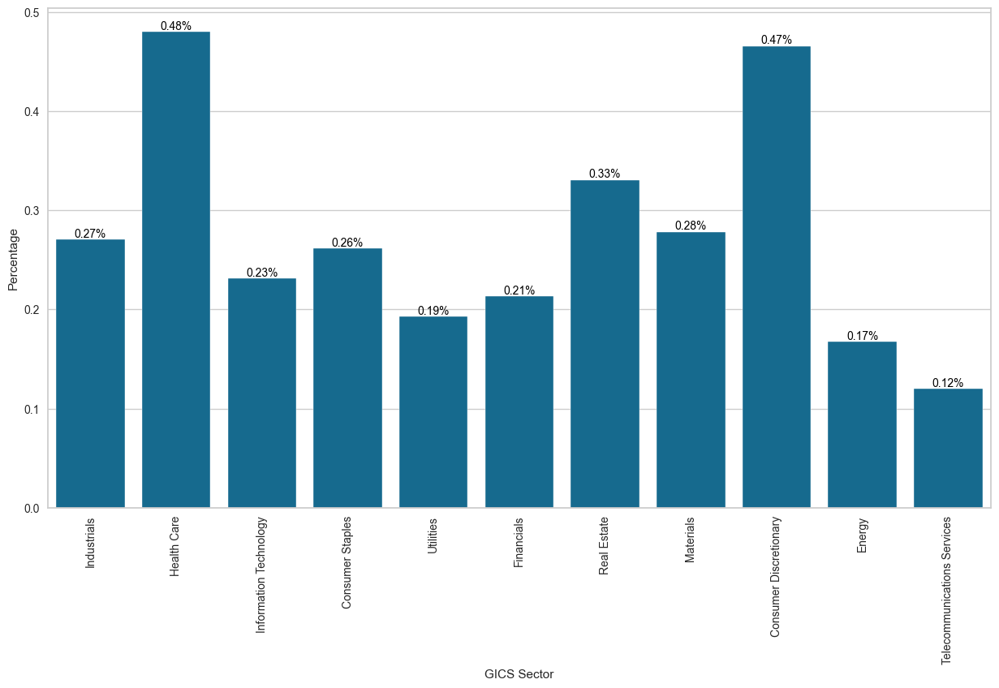

In [ ]:
# Calculate percentage of the total for 'Current Price'
total_price = df['Current Price'].sum()
df['Percentage'] = (df['Current Price'] / total_price) * 100

# Plot
plt.figure(figsize=(15, 8))
barplot = sns.barplot(data=df, x='GICS Sector', y='Percentage', ci=False)  ## code to choose the right variables
plt.xticks(rotation=90)

# Annotate each bar with percentage value
for p in barplot.patches:
    barplot.annotate(f'{p.get_height():.2f}%',
                     (p.get_x() + p.get_width() / 2., p.get_height()),
                     ha='center', va='center', fontsize=10, color='black',
                     xytext=(0, 5),
                     textcoords='offset points')

plt.show()

**GICS Sector vs. Cash Ratio**

**Cash ratio provides a measure of a company's ability to cover its short-term obligations using only cash and cash equivalents. Let's see how the average cash ratio varies across economic sectors.**

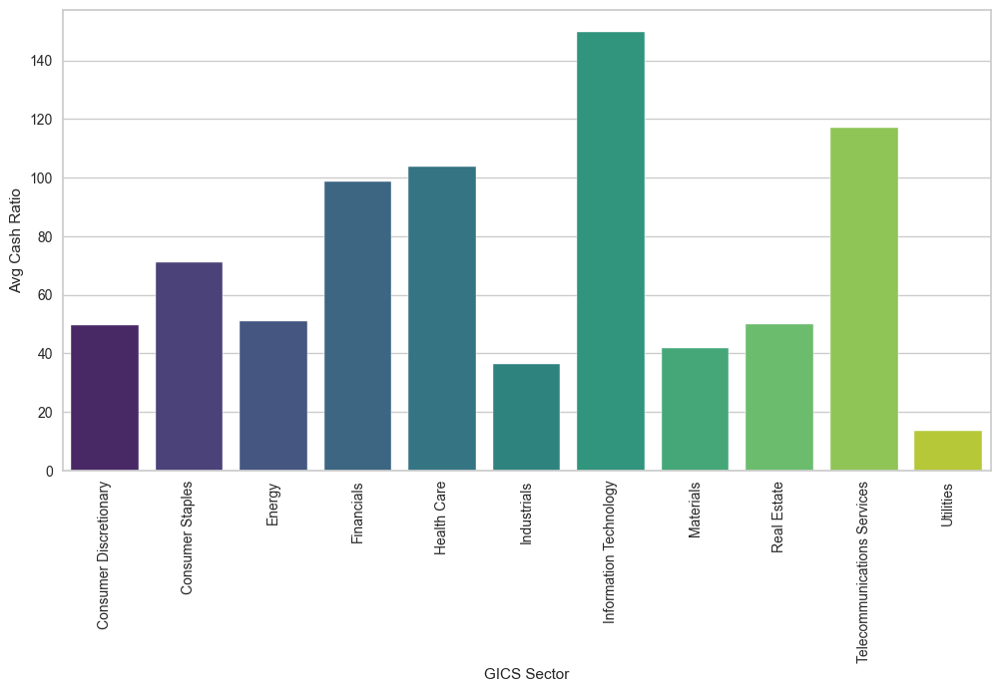

The sector with the highest average cash ratio is: Information Technology with an average cash ratio of 149.82.


In [ ]:
sector_avg_cash_ratio = df.groupby('GICS Sector')['Cash Ratio'].mean().reset_index()
sector_avg_cash_ratio.rename(columns={'Cash Ratio': 'Avg Cash Ratio'}, inplace=True)

plt.figure(figsize=(12, 6))
sns.barplot(data=sector_avg_cash_ratio, x='GICS Sector', y='Avg Cash Ratio', palette='viridis')

# Annotate the bar plot with the percentage values
for p in bar_plot.patches:
        bar_plot.annotate(f'{p.get_height():.2f}%',
                          (p.get_x() + p.get_width() / 2., p.get_height()),
                          ha='center', va='center',
                          xytext=(0, 10),
                          textcoords='offset points')


plt.xticks(rotation=90)
plt.show()



# Determine the sector with the highest average cash ratio
max_cash_ratio_sector = sector_avg_cash_ratio.loc[sector_avg_cash_ratio['Avg Cash Ratio'].idxmax()]
print(f"The sector with the highest average cash ratio is: {max_cash_ratio_sector['GICS Sector']} with an average cash ratio of {max_cash_ratio_sector['Avg Cash Ratio']:.2f}.")

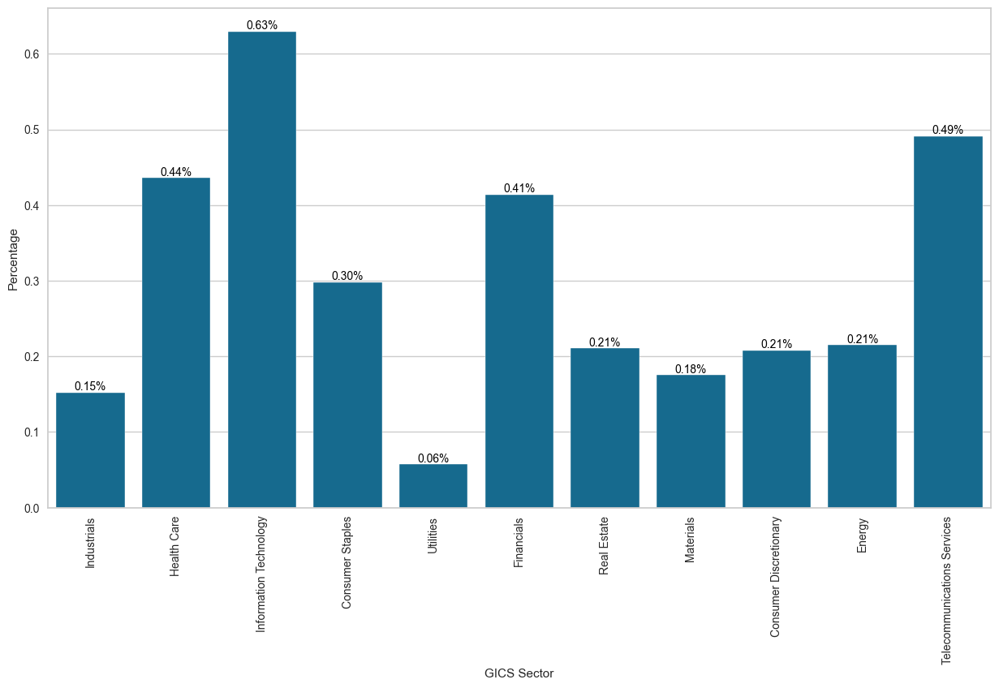

In [ ]:
# Calculate total sum to compute percentage
total_cash_ratio = df['Cash Ratio'].sum()

# Create a new column for percentages
df['Percentage'] = (df['Cash Ratio'] / total_cash_ratio) * 100

# Initialize the plot
plt.figure(figsize=(15, 8))
barplot = sns.barplot(data=df, x='GICS Sector', y='Percentage', ci=False)  # Adjust variables accordingly
plt.xticks(rotation=90)

# Annotate each bar with its percentage
for p in barplot.patches:
    barplot.annotate(f'{p.get_height():.2f}%',
                     (p.get_x() + p.get_width() / 2., p.get_height()),
                     ha='center', va='center', fontsize=10, color='black',
                     xytext=(0, 5),
                     textcoords='offset points')

# Show the plot
plt.show()



**GICS Sector vs. P/E Ratio**


**P/E ratios can help determine the relative value of a company's shares as they signify the amount of money an investor is willing to invest in a single share of a company per dollar of its earnings. Let's see how the P/E ratio varies, on average, across economic sectors.**

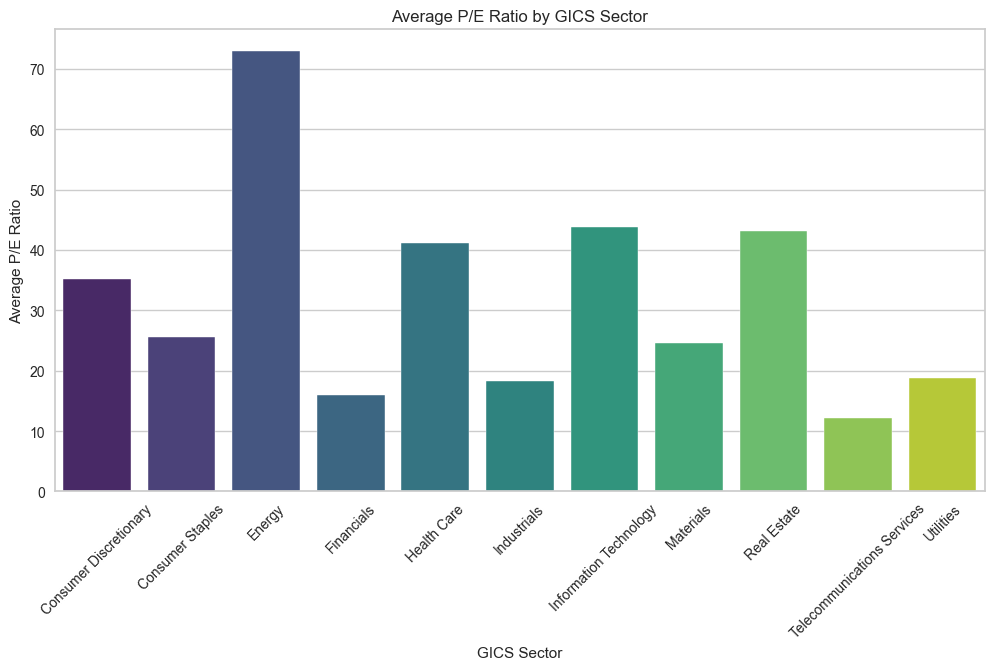

The sector with the highest average P/E ratio is: Energy with an average P/E ratio of 72.90.


In [ ]:
sector_avg_pe_ratio = df.groupby('GICS Sector')['P/E Ratio'].mean().reset_index()
sector_avg_pe_ratio.rename(columns={'P/E Ratio': 'Avg P/E Ratio'}, inplace=True)

plt.figure(figsize=(12, 6))
sns.barplot(data=sector_avg_pe_ratio, x='GICS Sector', y='Avg P/E Ratio', palette='viridis')
plt.title('Average P/E Ratio by GICS Sector')
plt.xlabel('GICS Sector')
plt.ylabel('Average P/E Ratio')
plt.xticks(rotation=45)
plt.show()

# Determine the sector with the highest average P/E ratio
max_pe_ratio_sector = sector_avg_pe_ratio.loc[sector_avg_pe_ratio['Avg P/E Ratio'].idxmax()]
print(f"The sector with the highest average P/E ratio is: {max_pe_ratio_sector['GICS Sector']} with an average P/E ratio of {max_pe_ratio_sector['Avg P/E Ratio']:.2f}.")

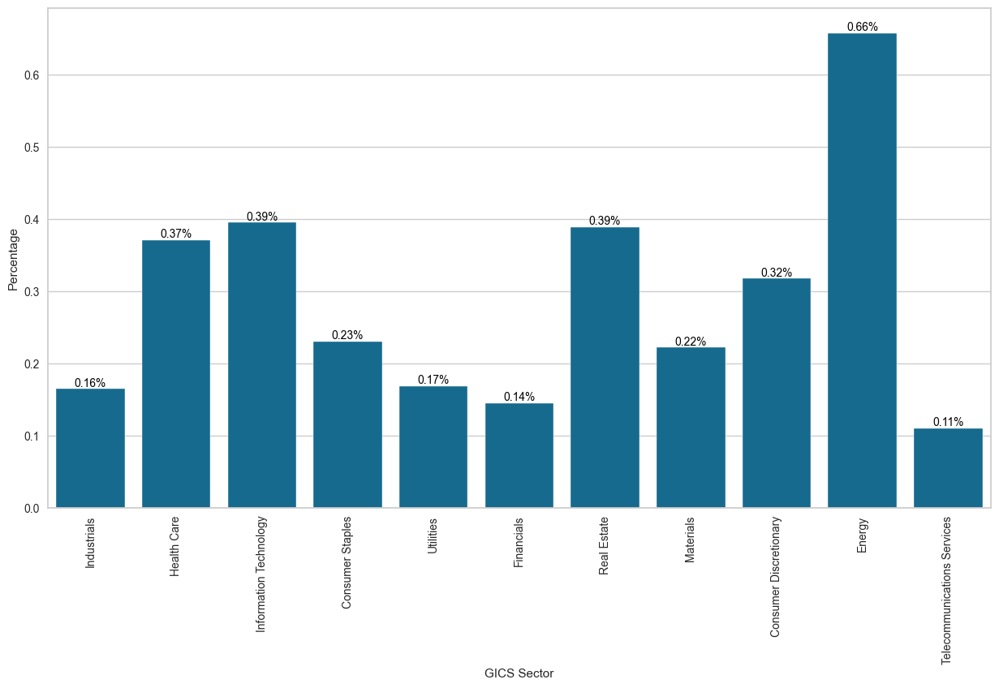

In [ ]:
# Calculate the total sum to compute percentages
total_PE_Ratio = df['P/E Ratio'].sum()

# Create a new column for percentages
df['Percentage'] = (df['P/E Ratio'] / total_PE_Ratio) * 100

# Initialize the plot
plt.figure(figsize=(15, 8))
barplot = sns.barplot(data=df, x='GICS Sector', y='Percentage', ci=False)  # Ensure right variables are chosen
plt.xticks(rotation=90)

# Annotate each bar with its percentage
for p in barplot.patches:
    barplot.annotate(f'{p.get_height():.2f}%',
                     (p.get_x() + p.get_width() / 2., p.get_height()),
                     ha='center', va='center', fontsize=10, color='black',
                     xytext=(0, 5),
                     textcoords='offset points')

# Show the plot
plt.show()



**GICS Sector vs. Volatility**

**Volatility accounts for the fluctuation in the stock price. A stock with high volatility will witness sharper price changes, making it a riskier investment. Let's see how volatility varies, on average, across economic sectors.**

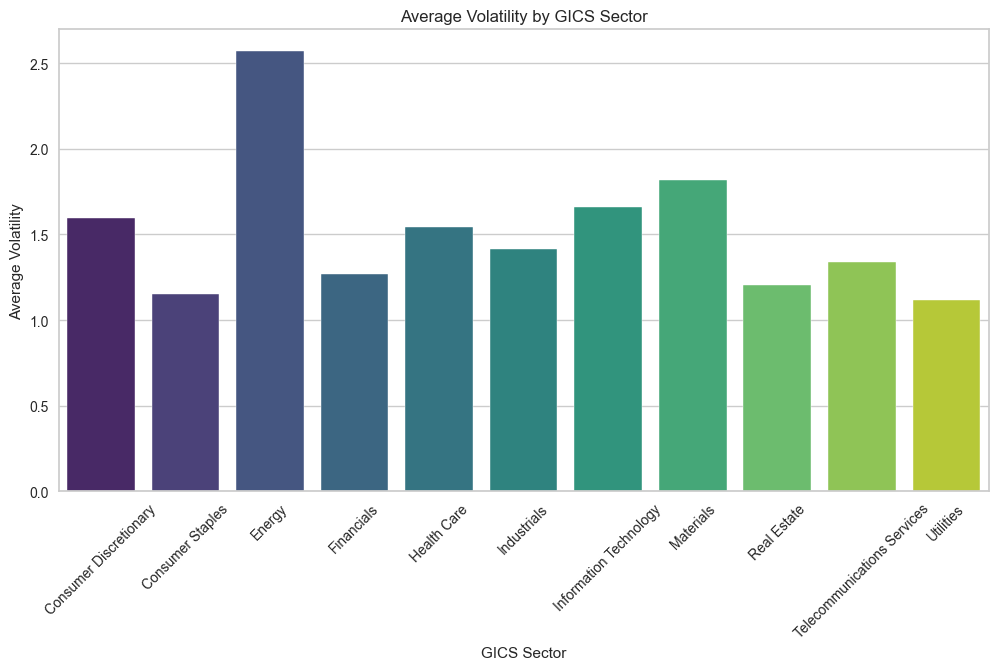

The sector with the highest average volatility is: Energy with an average volatility of 2.57.


In [ ]:
# Calculate the average volatility for each sector
sector_avg_volatility = df.groupby('GICS Sector')['Volatility'].mean().reset_index()
sector_avg_volatility.rename(columns={'Volatility': 'Avg Volatility'}, inplace=True)

# Plot the average volatility by sector
plt.figure(figsize=(12, 6))
sns.barplot(data=sector_avg_volatility, x='GICS Sector', y='Avg Volatility', palette='viridis')
plt.title('Average Volatility by GICS Sector')
plt.xlabel('GICS Sector')
plt.ylabel('Average Volatility')
plt.xticks(rotation=45)
plt.show()

# Determine the sector with the highest average volatility
max_volatility_sector = sector_avg_volatility.loc[sector_avg_volatility['Avg Volatility'].idxmax()]
print(f"The sector with the highest average volatility is: {max_volatility_sector['GICS Sector']} with an average volatility of {max_volatility_sector['Avg Volatility']:.2f}.")



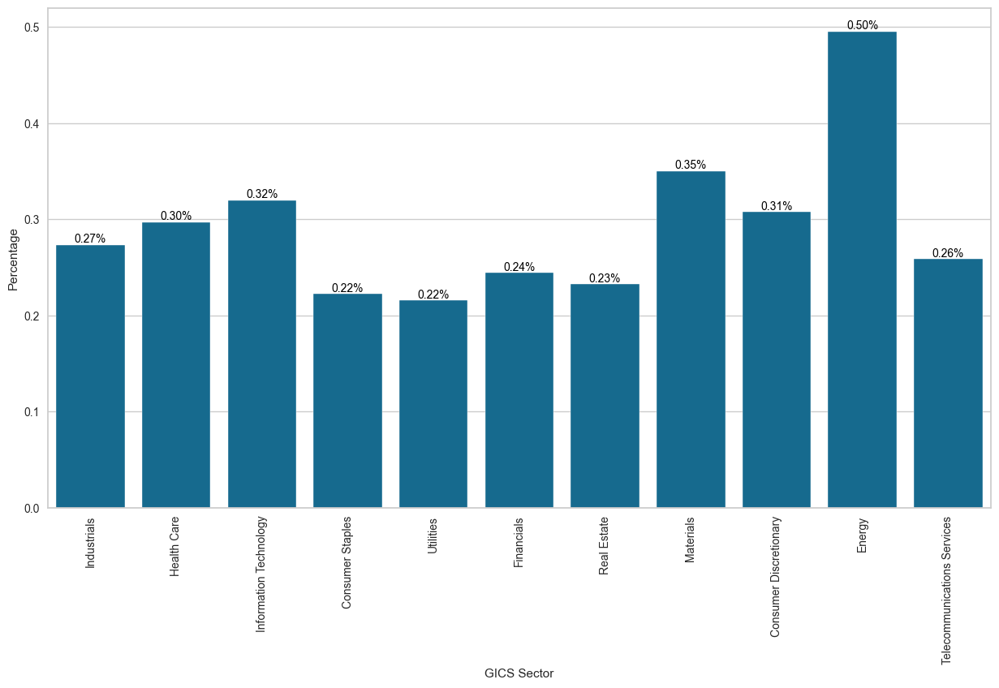

In [ ]:
# Calculate the total sum to compute percentages
total_Volatility = df['Volatility'].sum()

# Create a new column for percentages
df['Percentage'] = (df['Volatility'] /total_Volatility) * 100

# Initialize the plot
plt.figure(figsize=(15, 8))
barplot = sns.barplot(data=df, x='GICS Sector', y='Percentage', ci=False)  # Ensure right variables are chosen
plt.xticks(rotation=90)

# Annotate each bar with its percentage
for p in barplot.patches:
    barplot.annotate(f'{p.get_height():.2f}%',
                     (p.get_x() + p.get_width() / 2., p.get_height()),
                     ha='center', va='center', fontsize=10, color='black',
                     xytext=(0, 5),
                     textcoords='offset points')

# Show the plot
plt.show()


**Price Change vs. Volatility**

**Do stocks with higher volatility show different price changes compared to more stable stocks?**



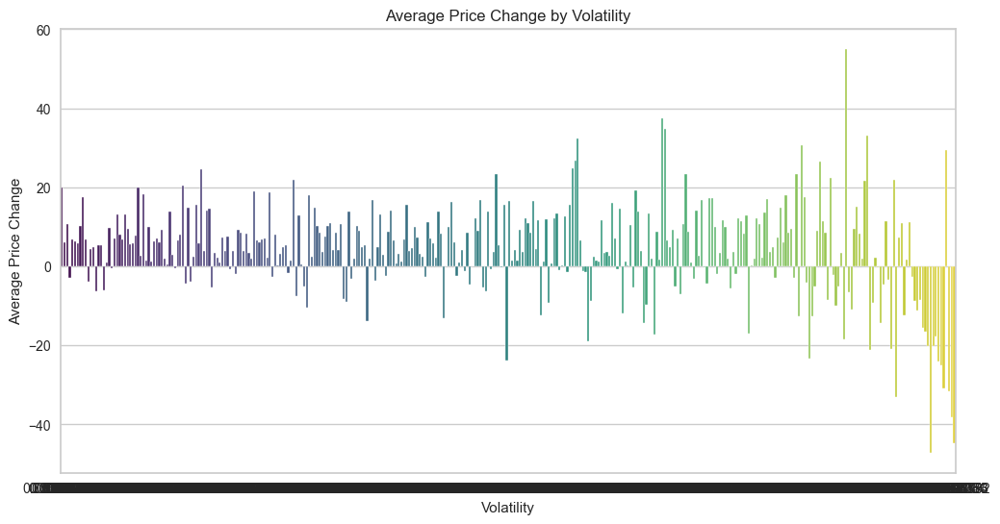

     Volatility  Avg Price Change
0      0.733163         19.939085
1      0.805357          6.072188
2      0.806056         10.660538
3      0.826408         -2.797977
4      0.839821          6.745943
..          ...               ...
335    3.719560        -30.988186
336    3.794783         29.496541
337    3.796410        -31.685167
338    4.559815        -38.101788
339    4.580042        -44.798137

[340 rows x 2 columns]


In [ ]:
# Calculate average Price Change for each volatility range
volatility_avg_price_change = df.groupby('Volatility')['Price Change'].mean().reset_index()
volatility_avg_price_change.rename(columns={'Price Change': 'Avg Price Change'}, inplace=True)

# Plot the average Price Change by Volatility Range
plt.figure(figsize=(12, 6))
sns.barplot(data=volatility_avg_price_change, x='Volatility', y='Avg Price Change', palette='viridis')
plt.title('Average Price Change by Volatility')
plt.xlabel('Volatility')
plt.ylabel('Average Price Change')
plt.show()

# Print the DataFrame to inspect calculated averages
print(volatility_avg_price_change)

**Price Change vs. Net Cash Flow:**

**Analyzing if there's any connection between the changes in stock prices and the company's cash flow.**

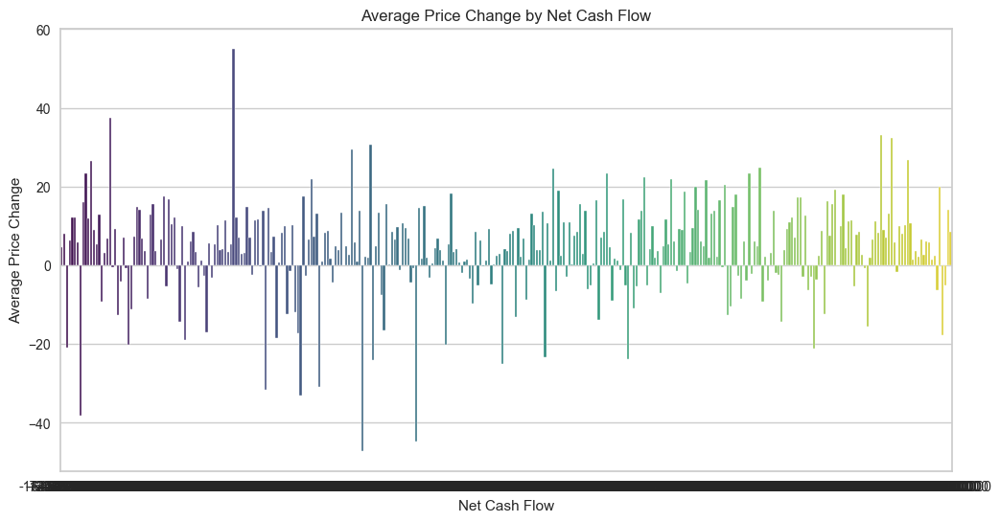

     Net Cash Flow  Avg Price Change
0     -11208000000          4.714695
1      -7341000000          8.033377
2      -6430000000        -20.802083
3      -6128000000          6.277303
4      -4496000000         12.163265
..             ...               ...
327     5607600000         19.939085
328     7523000000        -17.837838
329     7786000000         -5.101751
330    12747000000         14.035095
331    20764000000          8.440722

[332 rows x 2 columns]


In [ ]:
# Calculate average Price Change for each Net Cash Flow range
Net_Cash_Flow_avg_price_change = df.groupby('Net Cash Flow')['Price Change'].mean().reset_index()
Net_Cash_Flow_avg_price_change.rename(columns={'Price Change': 'Avg Price Change'}, inplace=True)

# Plot the average Price Change by Net Cash Flow Range
plt.figure(figsize=(12, 6))
sns.barplot(data=Net_Cash_Flow_avg_price_change, x='Net Cash Flow', y='Avg Price Change', palette='viridis')
plt.title('Average Price Change by Net Cash Flow')
plt.xlabel('Net Cash Flow')
plt.ylabel('Average Price Change')
plt.show()

# Print the DataFrame to inspect calculated averages
print(Net_Cash_Flow_avg_price_change)

**Current Price vs. Estimated Shares Outstanding:**

**To see if the number of shares outstanding has any effect on the current stock price.**


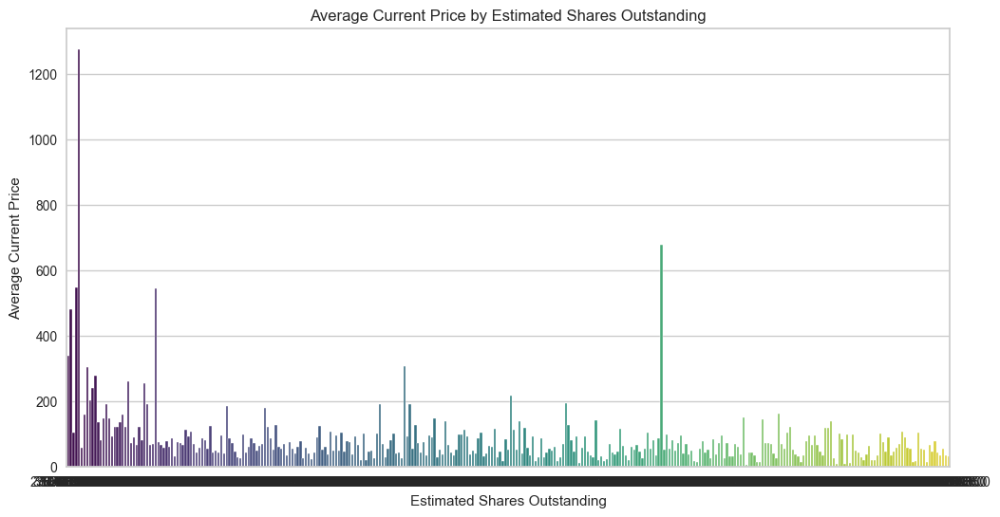

     Estimated Shares Outstanding  Avg Current Price
0                    2.767216e+07         339.130005
1                    3.108510e+07         479.850006
2                    3.606838e+07         103.930000
3                    3.710145e+07         546.159973
4                    5.093552e+07        1274.949951
..                            ...                ...
318                  4.349704e+09          42.959999
319                  4.738589e+09          34.450001
320                  5.477033e+09          54.360001
321                  5.630802e+09          34.410000
322                  6.159292e+09          32.279999

[323 rows x 2 columns]


In [ ]:
# Calculate Current Price for each Estimated Shares Outstanding
Estimated_Shares_Outstanding_avg_Current_Price = df.groupby('Estimated Shares Outstanding')['Current Price'].mean().reset_index()
Estimated_Shares_Outstanding_avg_Current_Price.rename(columns={'Current Price': 'Avg Current Price'}, inplace=True)

# Plot the average Current Price by Estimated Shares Outstanding
plt.figure(figsize=(12, 6))
sns.barplot(data=Estimated_Shares_Outstanding_avg_Current_Price, x='Estimated Shares Outstanding', y='Avg Current Price', palette='viridis')
plt.title('Average Current Price by Estimated Shares Outstanding')
plt.xlabel('Estimated Shares Outstanding')
plt.ylabel('Average Current Price')
plt.show()

# Print the DataFrame to inspect calculated averages
print(Estimated_Shares_Outstanding_avg_Current_Price)

**Current Price vs. ROE (Return on Equity)**

**Is there a relationship between the current stock price and the company's return on equity?**

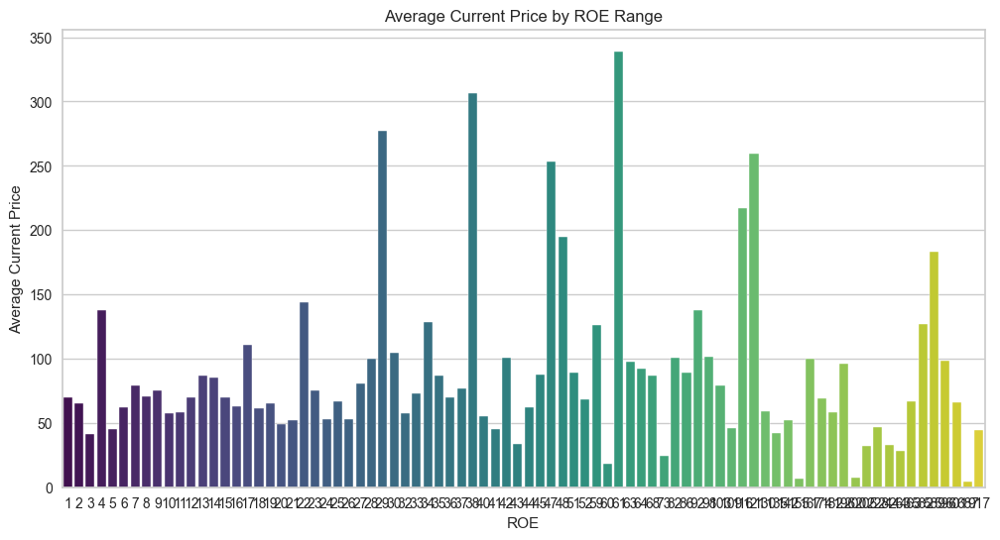

    ROE  Avg Current Price
0     1          70.123332
1     2          65.445714
2     3          41.301762
3     4         138.034447
4     5          44.891111
5     6          61.859662
6     7          78.842308
7     8          70.347857
8     9          75.473125
9    10          57.640625
10   11          58.717708
11   12          70.225555
12   13          86.631666
13   14          85.191685
14   15          69.793333
15   16          62.773334
16   17         110.948000
17   18          61.781666
18   19          65.347001
19   20          49.197143
20   21          52.293332
21   22         144.040001
22   23          75.134000
23   24          53.176667
24   25          67.005001
25   26          53.337143
26   27          80.920000
27   28          99.970000
28   29         277.608324
29   30         104.366002
30   32          57.765000
31   33          73.360001
32   34         128.474998
33   35          86.852001
34   36          69.909999
35   37          76.879997
3

In [ ]:
# Calculate average Current Price for each ROE range
roe_avg_price = df.groupby('ROE')['Current Price'].mean().reset_index()
roe_avg_price.rename(columns={'Current Price': 'Avg Current Price'}, inplace=True)

# Plot the average Current Price by ROE Range
plt.figure(figsize=(12, 6))
sns.barplot(data=roe_avg_price, x='ROE', y='Avg Current Price', palette='viridis')
plt.title('Average Current Price by ROE Range')
plt.xlabel('ROE')
plt.ylabel('Average Current Price')
plt.show()

# Print the DataFrame to inspect calculated averages
print(roe_avg_price)


**Current Price vs. P/E Ratio:**

**How does the earnings per share relate to the price-to-earnings ratio?**

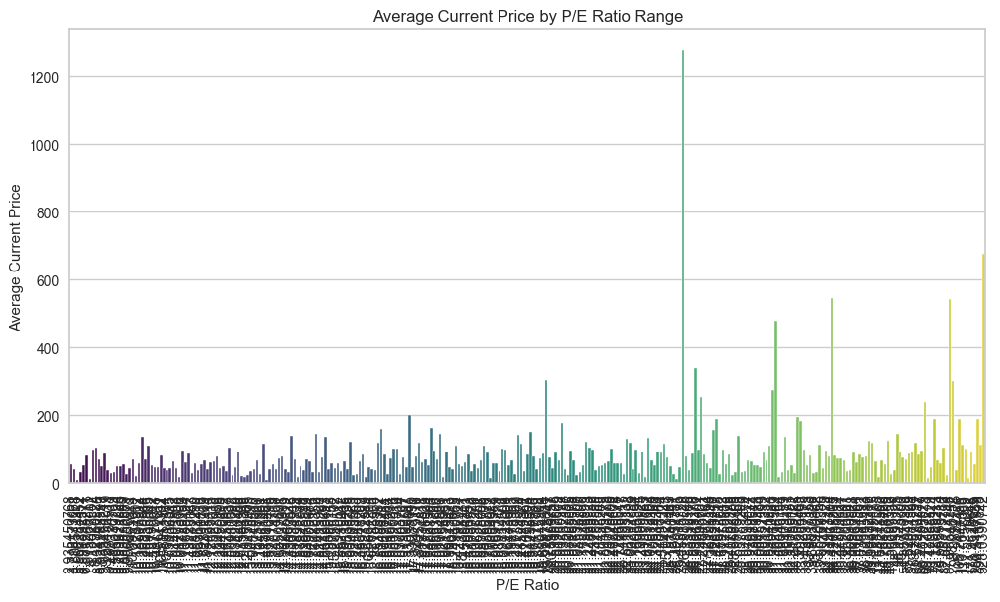

      P/E Ratio  Avg Current Price
0      2.935451          57.299999
1      3.718174          42.349998
2      4.304511          11.450000
3      5.566284          34.009998
4      5.598352          54.360001
..          ...                ...
290  171.962965          92.860001
291  178.451613          55.320000
292  280.514706         190.750000
293  394.413783         114.379997
294  528.039074         675.890015

[295 rows x 2 columns]


In [ ]:
# Calculate average Current Price for each P/E Ratio range
PE_Ratio_avg_price = df.groupby('P/E Ratio')['Current Price'].mean().reset_index()
PE_Ratio_avg_price.rename(columns = {'Current Price': 'Avg Current Price'}, inplace=True)

# Plot the average Current Price by P/E Ratio Range
plt.figure(figsize=(12, 6))
sns.barplot(data=PE_Ratio_avg_price, x='P/E Ratio', y='Avg Current Price', palette='viridis')
plt.title('Average Current Price by P/E Ratio Range')
plt.xlabel('P/E Ratio')
plt.ylabel('Average Current Price')
plt.xticks(rotation=90)  # Rotate x-ticks for better readability if needed
plt.show()

# Print the DataFrame to inspect calculated averages
print(PE_Ratio_avg_price)



**Current Price vs. P/B Ratio:**

**Investigate how the current price relates to the price-to-book ratio.**

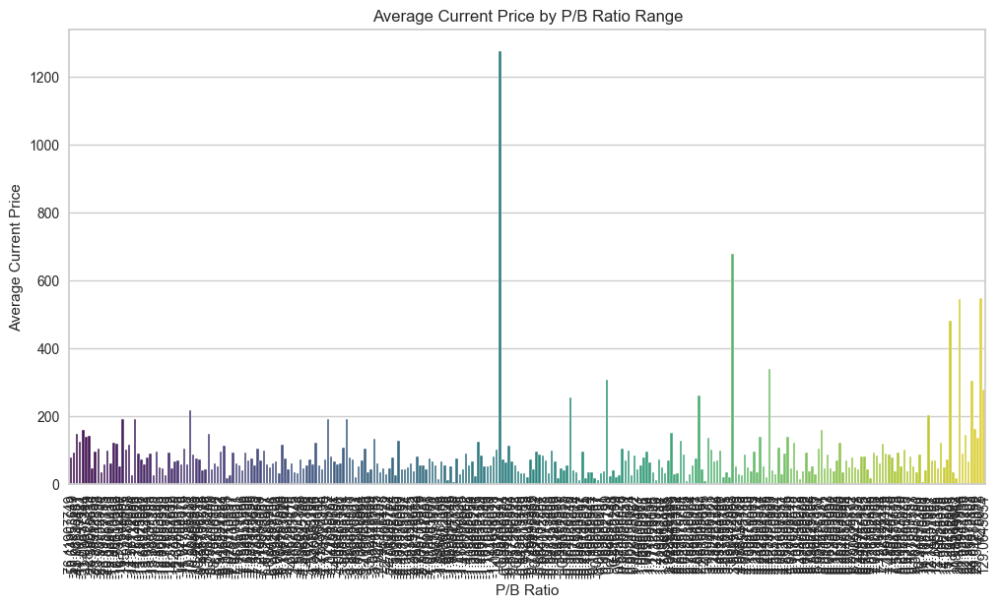

      P/B Ratio  Avg Current Price
0    -76.119077          78.333335
1    -58.649536          90.599998
2    -45.086335         146.869995
3    -44.103494         124.300003
4    -31.015380         159.759995
..          ...                ...
294   23.856728         302.399994
295   24.012322         162.330002
296   29.547150         134.580002
297   42.607500         546.159973
298  129.064585         276.570007

[299 rows x 2 columns]


In [ ]:
# Calculate average Current Price for each P/B Ratio range
PB_Ratio_avg_price = df.groupby('P/B Ratio')['Current Price'].mean().reset_index()
PB_Ratio_avg_price.rename(columns = {'Current Price': 'Avg Current Price'}, inplace=True)

# Plot the average Current Price by P/B Ratio Range
plt.figure(figsize=(12, 6))
sns.barplot(data=PB_Ratio_avg_price, x='P/B Ratio', y='Avg Current Price', palette='viridis')
plt.title('Average Current Price by P/B Ratio Range')
plt.xlabel('P/B Ratio')
plt.ylabel('Average Current Price')
plt.xticks(rotation=90)  # Rotate x-ticks for better readability if needed
plt.show()

# Print the DataFrame to inspect calculated averages
print(PB_Ratio_avg_price)


**Earnings Per Share vs. P/B Ratio:**

**Investigate how the current price relates to the price-to-book ratio.**

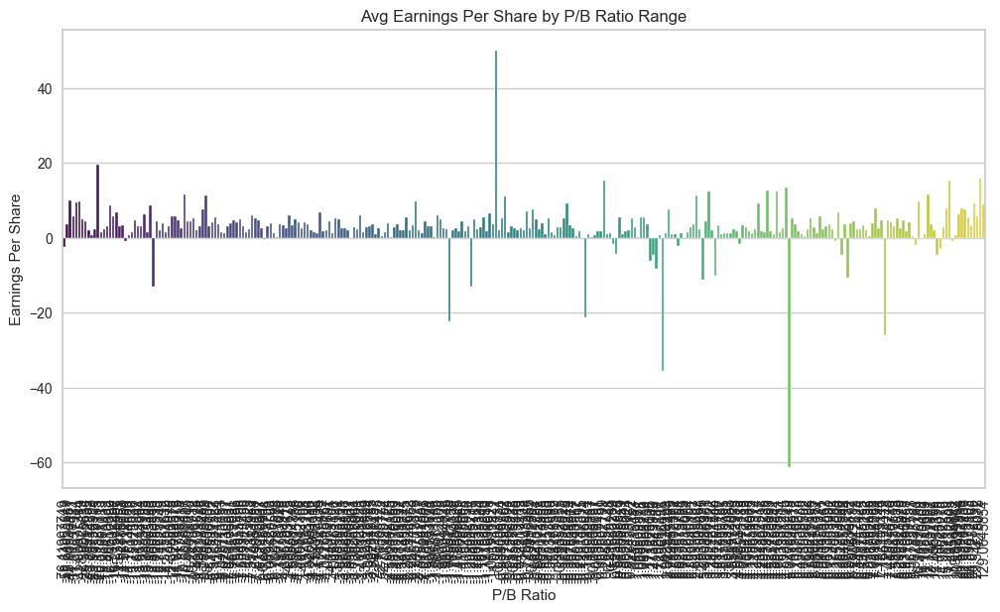

      P/B Ratio  Avg Earnings Per Share
0    -76.119077                   -2.43
1    -58.649536                    3.71
2    -45.086335                    9.95
3    -44.103494                    5.87
4    -31.015380                    9.49
..          ...                     ...
294   23.856728                    3.25
295   24.012322                    9.15
296   29.547150                    5.70
297   42.607500                   15.87
298  129.064585                    8.91

[299 rows x 2 columns]


In [ ]:
# Calculate average Current Price for each P/B Ratio range
Avg_Earnings_Per_Share = df.groupby('P/B Ratio')['Earnings Per Share'].mean().reset_index()
Avg_Earnings_Per_Share.rename(columns = {'Earnings Per Share': 'Avg Earnings Per Share'}, inplace=True)

# Plot the average Current Price by P/B Ratio Range
plt.figure(figsize=(12, 6))
sns.barplot(data=Avg_Earnings_Per_Share, x='P/B Ratio', y='Avg Earnings Per Share', palette='viridis')
plt.title('Avg Earnings Per Share by P/B Ratio Range')
plt.xlabel('P/B Ratio')
plt.ylabel('Earnings Per Share')
plt.xticks(rotation=90)  # Rotate x-ticks for better readability if needed
plt.show()

# Print the DataFrame to inspect calculated averages
print(Avg_Earnings_Per_Share)


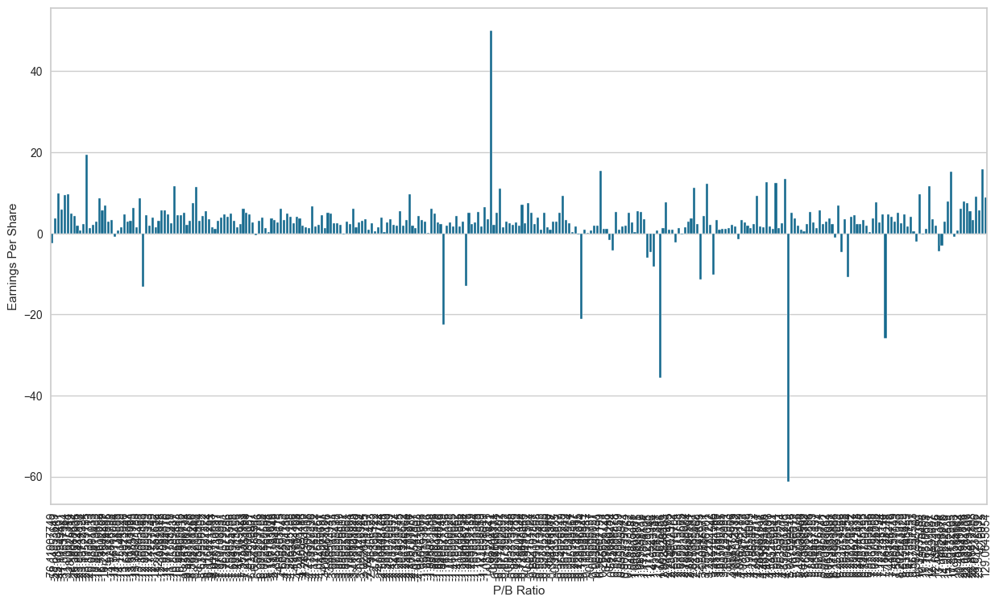

In [ ]:
plt.figure(figsize=(15,8))
sns.barplot(data=df, y='Earnings Per Share', x='P/B Ratio', ci=False)  ## code to choose the right variables
plt.xticks(rotation=90)
plt.show()

**Net Income vs. ROE:**

**Is there a relationship between net income and return on equity?**


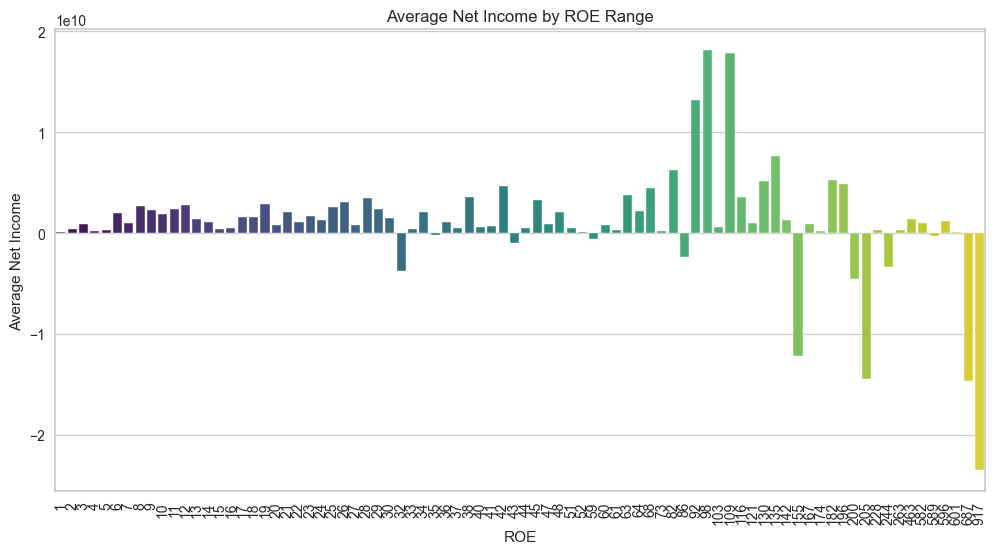

    ROE  Avg Net Income
0     1    1.553000e+08
1     2    3.805926e+08
2     3    8.813110e+08
3     4    2.282959e+08
4     5    2.930484e+08
5     6    2.037924e+09
6     7    1.001769e+09
7     8    2.717760e+09
8     9    2.282896e+09
9    10    1.939536e+09
10   11    2.434776e+09
11   12    2.765970e+09
12   13    1.353641e+09
13   14    1.123601e+09
14   15    4.059980e+08
15   16    5.433248e+08
16   17    1.622008e+09
17   18    1.636496e+09
18   19    2.887565e+09
19   20    7.684961e+08
20   21    2.134505e+09
21   22    1.120696e+09
22   23    1.736931e+09
23   24    1.290297e+09
24   25    2.547050e+09
25   26    3.046795e+09
26   27    8.057652e+08
27   28    3.527000e+09
28   29    2.355519e+09
29   30    1.526548e+09
30   32   -3.745000e+09
31   33    4.272350e+08
32   34    2.100998e+09
33   35   -1.980558e+08
34   36    1.128398e+09
35   37    5.075770e+08
36   38    3.547000e+09
37   40    6.068280e+08
38   41    7.522070e+08
39   42    4.679500e+09
40   43   -1.022

In [ ]:
# Calculate average Net Income for each ROE range
Avg_Net_Income = df.groupby('ROE')['Net Income'].mean().reset_index()
Avg_Net_Income.rename(columns={'Net Income': 'Avg Net Income'}, inplace=True)

# Plot the average Net Income by ROE Range
plt.figure(figsize=(12, 6))
sns.barplot(data=Avg_Net_Income, x='ROE', y='Avg Net Income', palette='viridis')
plt.title('Average Net Income by ROE Range')
plt.xlabel('ROE')
plt.ylabel('Average Net Income')
plt.xticks(rotation=90)  # Rotate x-ticks for better readability if needed
plt.show()

# Print the DataFrame to inspect calculated averages
print(Avg_Net_Income)

**Scatterplot of ROE vs. Current Price with respect to GICS Sector**

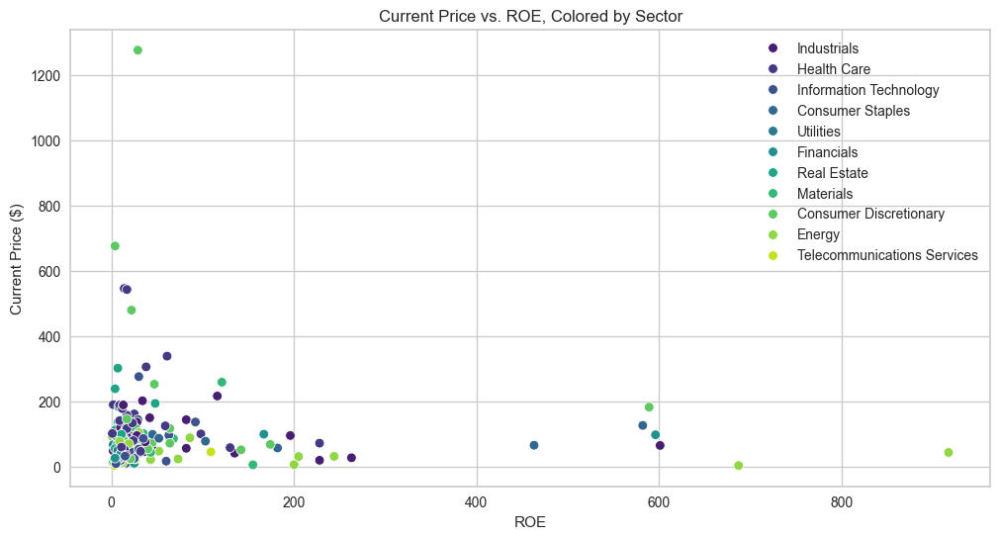

In [ ]:
plt.figure(figsize=(12, 6))
sns.scatterplot(data=df, x='ROE', y='Current Price', hue='GICS Sector', palette='viridis')
plt.title('Current Price vs. ROE, Colored by Sector')
plt.xlabel('ROE')
plt.ylabel('Current Price ($)')
plt.legend(bbox_to_anchor=(1, 1))
plt.show()

## Data Preprocessing

### Outlier Check

- Let's plot the boxplots of all numerical columns to check for outliers.

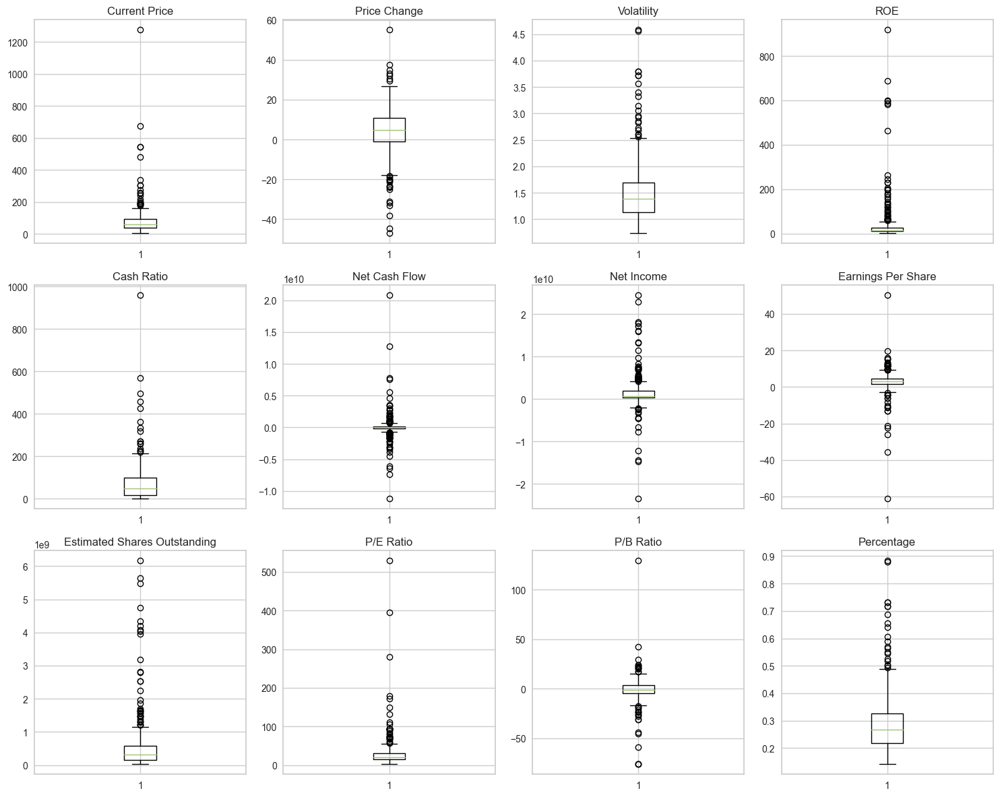

In [ ]:
plt.figure(figsize=(15, 12))

numeric_columns = df.select_dtypes(include=np.number).columns.tolist()

for i, variable in enumerate(numeric_columns):
    plt.subplot(3, 4, i + 1)
    plt.boxplot(df[variable], whis=1.5)
    plt.tight_layout()
    plt.title(variable)

plt.show()

### Scaling

- Let's scale the data before we proceed with clustering.

In [ ]:
# scaling the data before clustering
scaler = StandardScaler()
subset = df[num_col].copy() ## the code to scale the data
subset_scaled = scaler.fit_transform(subset)

In [ ]:
# creating a dataframe of the scaled data
subset_scaled_df = pd.DataFrame(subset_scaled, columns=subset.columns)

## K-means Clustering

### Checking Elbow Plot

In [ ]:
k_means_df = subset_scaled_df.copy()

Number of Clusters: 1 	Average Distortion: 2.5425069919221697
Number of Clusters: 2 	Average Distortion: 2.382318498894466
Number of Clusters: 3 	Average Distortion: 2.2692367155390745
Number of Clusters: 4 	Average Distortion: 2.1745559827866363
Number of Clusters: 5 	Average Distortion: 2.128799332840716
Number of Clusters: 6 	Average Distortion: 2.080400099226289
Number of Clusters: 7 	Average Distortion: 2.0289794220177395
Number of Clusters: 8 	Average Distortion: 1.964144163389972
Number of Clusters: 9 	Average Distortion: 1.9221492045198068
Number of Clusters: 10 	Average Distortion: 1.8513913649973124
Number of Clusters: 11 	Average Distortion: 1.8024134734578485
Number of Clusters: 12 	Average Distortion: 1.7900931879652673
Number of Clusters: 13 	Average Distortion: 1.7417609203336912
Number of Clusters: 14 	Average Distortion: 1.673559857259703


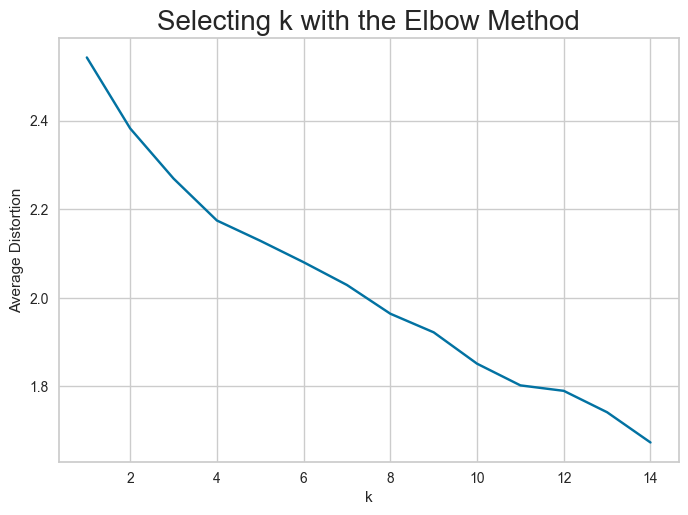

In [ ]:
clusters = range(1, 15)
meanDistortions = []

for k in clusters:
    model = KMeans(n_clusters=k, random_state=1)
    model.fit(subset_scaled_df)
    prediction = model.predict(k_means_df)
    distortion = (
        sum(np.min(cdist(k_means_df, model.cluster_centers_, "euclidean"), axis=1))
        / k_means_df.shape[0]
    )

    meanDistortions.append(distortion)

    print("Number of Clusters:", k, "\tAverage Distortion:", distortion)

plt.plot(clusters, meanDistortions, "bx-")
plt.xlabel("k")
plt.ylabel("Average Distortion")
plt.title("Selecting k with the Elbow Method", fontsize=20)
plt.show()

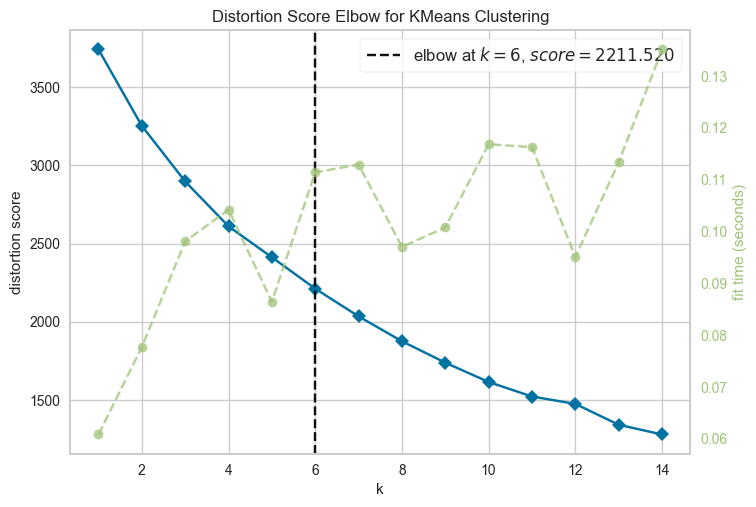

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [ ]:
model = KMeans(random_state=1)
visualizer = KElbowVisualizer(model, k=(1, 15), timings=True)
visualizer.fit(k_means_df)  # fit the data to the visualizer
visualizer.show()  # finalize and render figure

### Let's check the silhouette scores

For n_clusters = 2, the silhouette score is 0.43969639509980457)
For n_clusters = 3, the silhouette score is 0.4644405674779404)
For n_clusters = 4, the silhouette score is 0.4577225970476733)
For n_clusters = 5, the silhouette score is 0.43228336443659804)
For n_clusters = 6, the silhouette score is 0.4005422737213617)
For n_clusters = 7, the silhouette score is 0.3976335364987305)
For n_clusters = 8, the silhouette score is 0.40278401969450467)
For n_clusters = 9, the silhouette score is 0.3778585981433699)
For n_clusters = 10, the silhouette score is 0.13458938329968687)
For n_clusters = 11, the silhouette score is 0.1421832155528444)
For n_clusters = 12, the silhouette score is 0.2044669621527429)
For n_clusters = 13, the silhouette score is 0.23424874810104204)
For n_clusters = 14, the silhouette score is 0.12102526472829901)


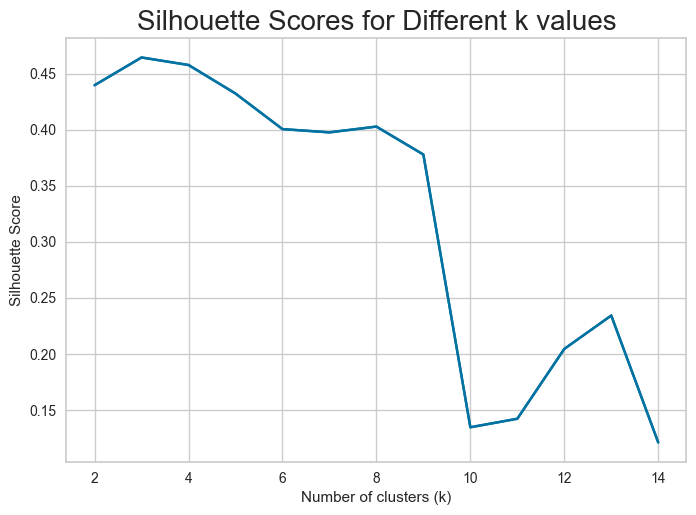

In [ ]:
sil_score = []
cluster_list = range(2, 15)
for n_clusters in cluster_list:
    clusterer = KMeans(n_clusters=n_clusters, random_state=1)
    preds = clusterer.fit_predict((subset_scaled_df))
    score = silhouette_score(k_means_df, preds)
    sil_score.append(score)
    print("For n_clusters = {}, the silhouette score is {})".format(n_clusters, score))

plt.plot(cluster_list, sil_score)

# Plotting the silhouette scores
plt.plot(cluster_list, sil_score, "bx-")
plt.xlabel("Number of clusters (k)")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Scores for Different k values", fontsize=20)
plt.show()

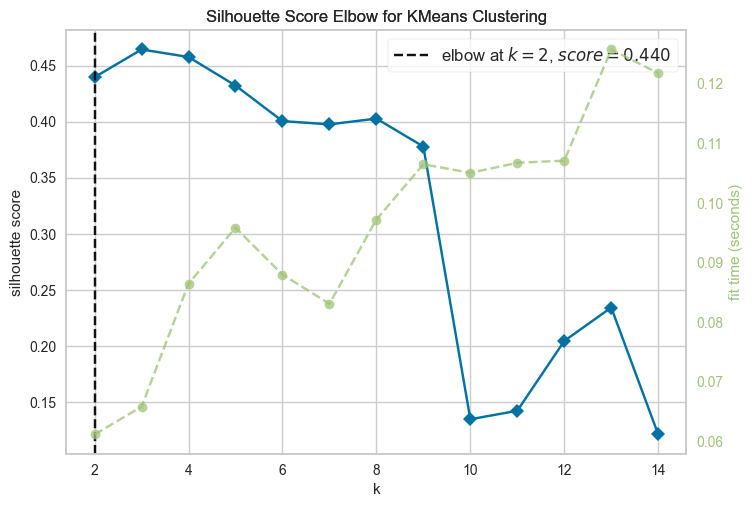

<Axes: title={'center': 'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [ ]:
model = KMeans(random_state=1)
visualizer = KElbowVisualizer(model, k=(2, 15), metric="silhouette", timings=True)
visualizer.fit(k_means_df)  # fit the data to the visualizer

# Plotting the silhouette scores
plt.xlabel("Number of clusters (k)")
plt.ylabel("Silhouette Score")
plt.title('Silhouette Score Elbow for KMeans Clustering')
visualizer.show()  # finalize and render figure


**From the silhouette score Elbow for K-means clustering, it seems that 3 or 9 is a good value of k.**

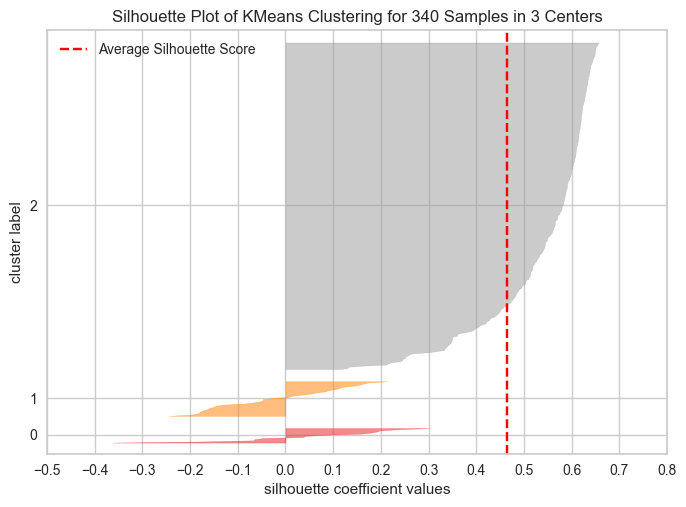

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 340 Samples in 3 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [ ]:
# finding optimal no. of clusters with silhouette coefficients
visualizer = SilhouetteVisualizer(KMeans(3, random_state=1))  ## Complete the code to visualize the silhouette scores for certain number of clusters
visualizer.fit(k_means_df)
visualizer.show()

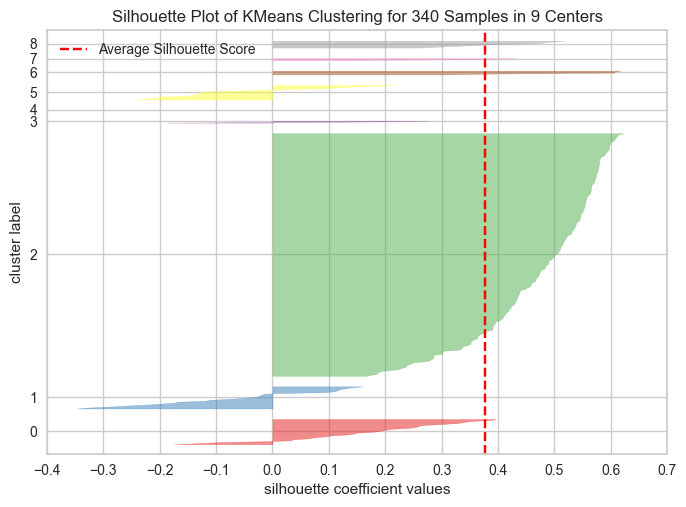

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 340 Samples in 9 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [ ]:
# finding optimal no. of clusters with silhouette coefficients
visualizer = SilhouetteVisualizer(KMeans(9, random_state=1))  ## Complete the code to visualize the silhouette scores for certain number of clusters
visualizer.fit(k_means_df)
visualizer.show()

**Observations on comparing 3 clusters and 9 clusters**

1.The average Silhouette coefficient of 0.5 for 3 clusters suggests better overall performance compared to 0.4 for 9 clusters. This implies that with 3 clusters, the average distance between clusters is greater relative to intra-cluster distance, indicating more distinct clusters.

.
The maximum Silhouette coefficient for 3 clusters is also higher at 0.8 compared to 0.7 for 9 clusters, suggesting that some clusters in the 3-cluster configuration are more dist

.
c3.

While the 3-cluster configuration does have some negative values indicating misclassification or overlapping clusters, the good performance of other clusters with values close to 0.8 suggests that most of the data is well-teredtion:

### Creating Final Model

**We shall consider 3 or 9 as the appropriate number of clusters to create two models with respect to Elbow for KMeans clustering for both number of clusters and compare their results.**

**Final Model 1: n_clusters = 3**


In [ ]:
%%time

# final K-means model
kmeans = KMeans(n_clusters=3, random_state=1)  ## Complete the code to choose the number of clusters
kmeans.fit(k_means_df)

CPU times: total: 31.2 ms
Wall time: 124 ms


KMeans(n_clusters=3, random_state=1)

In [ ]:
# creating a copy of the original data
df1 = df.copy()

# adding kmeans cluster labels to the original and scaled dataframes
k_means_df["KM_segments"] = kmeans.labels_
df1["KM_segments"] = kmeans.labels_

**Cluster Profiling**

In [ ]:
km_cluster_profile = df1.groupby("KM_segments").mean(numeric_only=True)  ## Complete the code to groupby the cluster labels

In [ ]:
km_cluster_profile["count_in_each_segment"] = (
    df1.groupby("KM_segments")["Security"].count().values  ## the code to groupby the cluster labels
)

In [ ]:
km_cluster_profile.style.highlight_max(color="lightgreen", axis=0)

,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio,Percentage,count_in_each_segment
KM_segments,,,,,,,,,,,,,
0,52.142857,6.779993,1.175153,26.142857,140.142857,760285714.285714,13368785714.285715,3.769286,3838879870.871428,20.654832,-3.529270,0.226500,14
1,64.183438,-10.557046,2.797776,96.531250,70.718750,159171125.000000,-3250005968.750000,-7.886875,526459323.057500,111.333230,1.783445,0.539245,32
2,84.045331,5.542488,1.404255,34.040816,66.608844,10698350.340136,1445333183.673469,3.890051,427206184.715408,24.613743,-2.013147,0.270657,294


In [ ]:
## Complete the code to print the companies in each cluster
for cl in df1["GICS Sector"].unique():
    print("In cluster {}, the following companies are present:".format(cl))
    print(df1[df1["GICS Sector"] == cl]["Security"].unique())
    print()

In cluster Industrials, the following companies are present:
['American Airlines Group' 'Alaska Air Group Inc' 'Allegion' 'AMETEK Inc'
 'Arconic Inc' 'Boeing Company' 'Caterpillar Inc.'
 'C. H. Robinson Worldwide' 'Cummins Inc.' 'CSX Corp.' 'Delta Air Lines'
 'Deere & Co.' 'Danaher Corp.' 'Dun & Bradstreet' 'Dover Corp.'
 'Equifax Inc.' 'Eaton Corporation' "Expeditors Int'l" 'Fastenal Co'
 'Fortune Brands Home & Security' 'Fluor Corp.' 'Flowserve Corporation'
 'General Dynamics' 'Grainger (W.W.) Inc.' "Honeywell Int'l Inc."
 'Illinois Tool Works' 'J. B. Hunt Transport Services'
 'Jacobs Engineering Group' 'Kansas City Southern' 'Leggett & Platt'
 'L-3 Communications Holdings' 'Lockheed Martin Corp.'
 'Southwest Airlines' 'Masco Corp.' '3M Company' 'Nielsen Holdings'
 'Norfolk Southern Corp.' 'Pitney-Bowes' 'PACCAR Inc.' 'Pentair Ltd.'
 'Quanta Services Inc.' 'Ryder System' 'Robert Half International'
 'Roper Industries' 'Republic Services Inc' 'Stericycle Inc'
 'United Continental Hold

In [ ]:
df1.groupby(["KM_segments", "GICS Sector"])['Security'].count()

KM_segments  GICS Sector                
0            Consumer Discretionary          1
             Consumer Staples                1
             Energy                          1
             Financials                      4
             Health Care                     3
             Information Technology          2
             Telecommunications Services     2
1            Consumer Discretionary          2
             Energy                         23
             Health Care                     1
             Industrials                     1
             Information Technology          4
             Materials                       1
2            Consumer Discretionary         37
             Consumer Staples               18
             Energy                          6
             Financials                     45
             Health Care                    36
             Industrials                    52
             Information Technology         27
             Materi

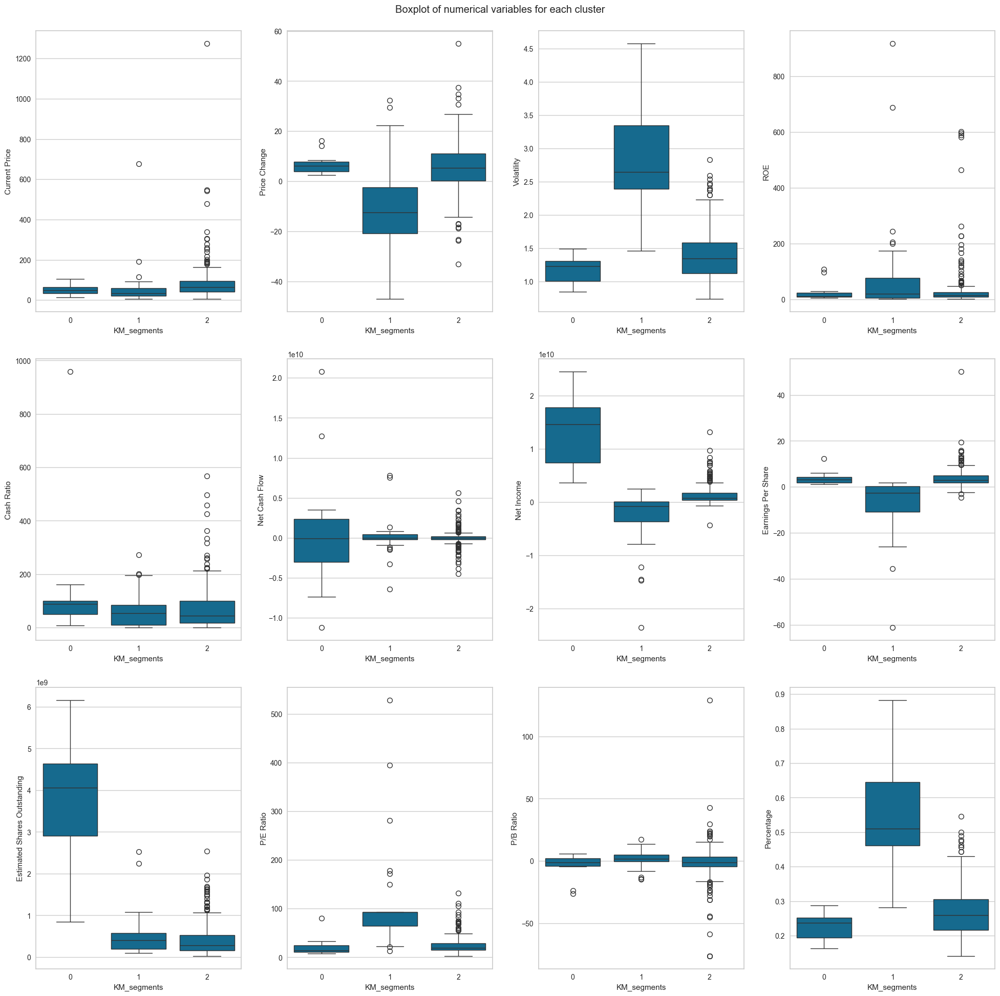

In [ ]:
plt.figure(figsize=(20, 20))
plt.suptitle("Boxplot of numerical variables for each cluster")

# selecting numerical columns
num_col = df.select_dtypes(include=np.number).columns.tolist()

for i, variable in enumerate(num_col):
    plt.subplot(3, 4, i + 1)
    sns.boxplot(data=df1, x="KM_segments", y=variable)

plt.tight_layout(pad=2.0)

In [ ]:
# Define KM-segments
"KM_segments" == np.random.choice([0, 1, 2], size=150),  # 3 clusters

# Function to generate concise summary for each cluster
def summarize_clusters(df1, clusters_col, num_columns):
    summary = {}
    for cluster in df1[clusters_col].unique():
        summary[cluster] = {}
        cluster_data = df1[df1[clusters_col] == cluster]

        for column in num_columns:
            col_data = cluster_data[column]
            summary[cluster][column] = {
                'Median': col_data.median(),
                'Mean': col_data.mean(),
                'Std Dev': col_data.std(),
                'Min': col_data.min(),
                'Max': col_data.max(),
                'Q1': col_data.quantile(0.25),
                'Q3': col_data.quantile(0.75)
            }
    return summary

# Generate summary
cluster_summary = summarize_clusters(df1, 'KM_segments', num_col)

# Print summary for each cluster
for cluster, variables in cluster_summary.items():
    print(f"\nCluster {cluster} Summary:")
    for variable, stats in variables.items():
        print(f"- {variable}:")
        for stat, value in stats.items():
            print(f"  {stat}: {value}")


Cluster 2 Summary:
- Current Price:
  Median: 64.375
  Mean: 84.04533058345918
  Std Dev: 97.68829194481002
  Min: 4.67
  Max: 1274.949951
  Q1: 41.86000175
  Q3: 95.22499875
- Price Change:
  Median: 5.328232334
  Mean: 5.542487991969388
  Std Dev: 10.080397282211699
  Min: -33.13126783
  Max: 55.05168339
  Q1: 0.23411528375000001
  Q3: 11.00335513
- Volatility:
  Median: 1.3458767335
  Mean: 1.4042549504115645
  Std Dev: 0.3721504696699035
  Min: 0.733163184
  Max: 2.830675228
  Q1: 1.12144687
  Q3: 1.5827259732499999
- ROE:
  Median: 15.5
  Mean: 34.04081632653061
  Std Dev: 78.31309154837238
  Min: 1
  Max: 601
  Q1: 10.0
  Q3: 26.0
- Cash Ratio:
  Median: 44.5
  Mean: 66.60884353741497
  Std Dev: 77.96433106306986
  Min: 0
  Max: 568
  Q1: 18.0
  Q3: 99.0
- Net Cash Flow:
  Median: 2330000.0
  Mean: 10698350.340136055
  Std Dev: 935272527.014589
  Min: -4496000000
  Max: 5607600000
  Q1: -181218250.0
  Q3: 157000000.0
- Net Income:
  Median: 761967000.0
  Mean: 1445333183.6734693

**Final Model 2: n_clusters = 9**

In [ ]:
%%time

# final K-means model
kmeans = KMeans(n_clusters=9, random_state=1)  ## Complete the code to choose the number of clusters
kmeans.fit(k_means_df)

CPU times: total: 46.9 ms
Wall time: 92.4 ms


KMeans(n_clusters=9, random_state=1)

In [ ]:
# creating a copy of the original data
df1 = df.copy()

# adding kmeans cluster labels to the original and scaled dataframes
k_means_df["KM_segments"] = kmeans.labels_
df1["KM_segments"] = kmeans.labels_

### Cluster Profiling

In [ ]:
km_cluster_profile = df1.groupby("KM_segments").mean(numeric_only=True)  ## Complete the code to groupby the cluster labels

In [ ]:
km_cluster_profile["count_in_each_segment"] = (
    df1.groupby("KM_segments")["Security"].count().values  ## the code to groupby the cluster labels
)

In [ ]:
km_cluster_profile.style.highlight_max(color="lightgreen", axis=0)

,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio,Percentage,count_in_each_segment
KM_segments,,,,,,,,,,,,,
0,94.907215,11.251566,1.344753,56.172414,51.129310,-2139568.965517,2161539646.551724,4.650259,535116592.742328,25.554724,-7.694782,0.259189,116
1,26.990000,-14.060688,3.296307,603.000000,57.333333,-585000000.000000,-17555666666.666668,-39.726667,481910081.666667,71.528835,1.638633,0.635332,3
2,53.123334,7.066778,1.331575,36.166667,150.166667,8873933333.333334,9441216666.666666,4.141667,2133426215.416667,26.775766,5.958862,0.256649,6
3,57.576541,0.378487,1.403937,19.337580,51.012739,11110993.630573,1009186509.554140,2.994936,356756588.490446,22.270800,-0.402841,0.270596,157
4,50.744999,5.512605,1.070356,24.875000,60.250000,-3860125000.000000,15782875000.000000,3.632500,4640082627.625000,16.598649,-7.787061,0.206301,8
5,327.006671,21.917380,2.029752,4.000000,106.000000,698240666.666667,287547000.000000,0.750000,366763235.300000,400.989188,-5.322376,0.391216,3
6,160.085605,13.814152,1.804744,25.409091,301.590909,31782272.727273,757690136.363636,3.703182,642111562.488636,47.424973,16.700740,0.347848,22
7,35.871667,-16.466316,2.871638,45.250000,49.000000,-180982958.333333,-2142358333.333333,-5.587917,477529063.751667,76.983648,1.786112,0.553481,24
8,1274.949951,3.190527,1.268340,29.000000,184.000000,-1671386000.000000,2551360000.000000,50.090000,50935516.070000,25.453183,-1.052429,0.244461,1


In [ ]:
## Complete the code to print the companies in each cluster
for cl in df1["GICS Sector"].unique():
    print("In cluster {}, the following companies are present:".format(cl))
    print(df1[df1["GICS Sector"] == cl]["Security"].unique())
    print()

In cluster Industrials, the following companies are present:
['American Airlines Group' 'Alaska Air Group Inc' 'Allegion' 'AMETEK Inc'
 'Arconic Inc' 'Boeing Company' 'Caterpillar Inc.'
 'C. H. Robinson Worldwide' 'Cummins Inc.' 'CSX Corp.' 'Delta Air Lines'
 'Deere & Co.' 'Danaher Corp.' 'Dun & Bradstreet' 'Dover Corp.'
 'Equifax Inc.' 'Eaton Corporation' "Expeditors Int'l" 'Fastenal Co'
 'Fortune Brands Home & Security' 'Fluor Corp.' 'Flowserve Corporation'
 'General Dynamics' 'Grainger (W.W.) Inc.' "Honeywell Int'l Inc."
 'Illinois Tool Works' 'J. B. Hunt Transport Services'
 'Jacobs Engineering Group' 'Kansas City Southern' 'Leggett & Platt'
 'L-3 Communications Holdings' 'Lockheed Martin Corp.'
 'Southwest Airlines' 'Masco Corp.' '3M Company' 'Nielsen Holdings'
 'Norfolk Southern Corp.' 'Pitney-Bowes' 'PACCAR Inc.' 'Pentair Ltd.'
 'Quanta Services Inc.' 'Ryder System' 'Robert Half International'
 'Roper Industries' 'Republic Services Inc' 'Stericycle Inc'
 'United Continental Hold

In [ ]:
df1.groupby(["KM_segments", "GICS Sector"])['Security'].count()

KM_segments  GICS Sector                
0            Consumer Discretionary         17
             Consumer Staples               13
             Energy                          3
             Financials                     16
             Health Care                    21
             Industrials                    18
             Information Technology          8
             Materials                       7
             Real Estate                    11
             Telecommunications Services     1
             Utilities                       1
1            Energy                          3
2            Consumer Discretionary          2
             Energy                          1
             Financials                      1
             Health Care                     1
             Information Technology          1
3            Consumer Discretionary         16
             Consumer Staples                4
             Energy                          3
             Financ

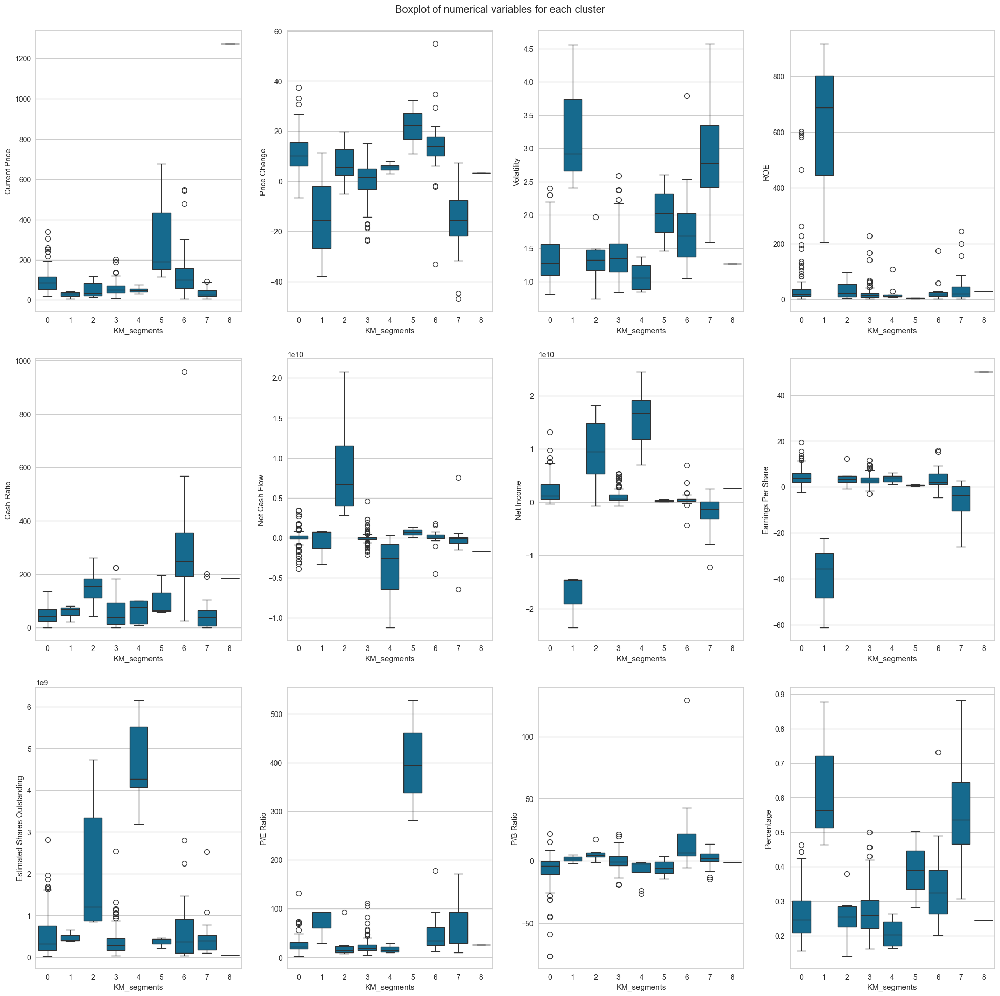

In [ ]:
plt.figure(figsize=(20, 20))
plt.suptitle("Boxplot of numerical variables for each cluster")

# selecting numerical columns
num_col = df.select_dtypes(include=np.number).columns.tolist()

for i, variable in enumerate(num_col):
    plt.subplot(3, 4, i + 1)
    sns.boxplot(data=df1, x="KM_segments", y=variable)

plt.tight_layout(pad=2.0)

In [ ]:
# Define KM-segments
"KM_segments" == np.random.choice(range(9), size=150)  # 9 clusters

# Function to generate concise summary for each cluster
def summarize_clusters(df1, clusters_col, num_columns):
    summary = {}
    for cluster in df1[clusters_col].unique():
        summary[cluster] = {}
        cluster_data = df1[df1[clusters_col] == cluster]

        for column in num_columns:
            col_data = cluster_data[column]
            summary[cluster][column] = {
                'Median': col_data.median(),
                'Mean': col_data.mean(),
                'Std Dev': col_data.std(),
                'Min': col_data.min(),
                'Max': col_data.max(),
                'Q1': col_data.quantile(0.25),
                'Q3': col_data.quantile(0.75)
            }
    return summary

# Generate summary
cluster_summary = summarize_clusters(df1, 'KM_segments', num_col)

# Print summary for each cluster
for cluster, variables in cluster_summary.items():
    print(f"\nCluster {cluster} Summary:")
    for variable, stats in variables.items():
        print(f"- {variable}:")
        for stat, value in stats.items():
            print(f"  {stat}: {value}")


Cluster 0 Summary:
- Current Price:
  Median: 87.6350025
  Mean: 94.90721538655171
  Std Dev: 58.789553457187004
  Min: 18.440001
  Max: 339.130005
  Q1: 55.1099995
  Q3: 114.99749725000001
- Price Change:
  Median: 10.280953805
  Mean: 11.251565820258621
  Std Dev: 7.659976600947542
  Min: -6.61133544
  Max: 37.48967666
  Q1: 6.19838142925
  Q3: 15.5822201825
- Volatility:
  Median: 1.2760530455
  Mean: 1.3447531823275862
  Std Dev: 0.3442475040276397
  Min: 0.80535713
  Max: 2.397802991
  Q1: 1.0877479445
  Q3: 1.5581983395
- ROE:
  Median: 18.0
  Mean: 56.172413793103445
  Std Dev: 117.79453562745671
  Min: 1
  Max: 601
  Q1: 11.0
  Q3: 36.5
- Cash Ratio:
  Median: 42.0
  Mean: 51.12931034482759
  Std Dev: 37.10655167098586
  Min: 0
  Max: 136
  Q1: 22.75
  Q3: 70.0
- Net Cash Flow:
  Median: 6597000.0
  Mean: -2139568.9655172415
  Std Dev: 1053412323.45016
  Min: -3857000000
  Max: 3428000000
  Q1: -164000000.0
  Q3: 273699250.0
- Net Income:
  Median: 1178780000.0
  Mean: 2161539

## Hierarchical Clustering

### Computing Cophenetic Correlation

In [ ]:
hc_df = subset_scaled_df.copy()

In [ ]:
# list of distance metrics
distance_metrics = ["euclidean", "chebyshev", "mahalanobis", "cityblock"]## the code to add distance metrics

# list of linkage methods
linkage_methods = ["single", "complete", "average", "weighted"] ## the code to add linkages

high_cophenet_corr = 0
high_dm_lm = [0, 0]

for dm in distance_metrics:
    for lm in linkage_methods:
        Z = linkage(hc_df, metric=dm, method=lm)
        c, coph_dists = cophenet(Z, pdist(hc_df))
        print(
            "Cophenetic correlation for {} distance and {} linkage is {}.".format(
                dm.capitalize(), lm, c
            )
        )
        if high_cophenet_corr < c:
            high_cophenet_corr = c
            high_dm_lm[0] = dm
            high_dm_lm[1] = lm

# printing the combination of distance metric and linkage method with the highest cophenetic correlation
print('*'*100)
print(
    "Highest cophenetic correlation is {}, which is obtained with {} distance and {} linkage.".format(
        high_cophenet_corr, high_dm_lm[0].capitalize(), high_dm_lm[1]
    )
)

Cophenetic correlation for Euclidean distance and single linkage is 0.9232271494002922.
Cophenetic correlation for Euclidean distance and complete linkage is 0.7873280186580672.
Cophenetic correlation for Euclidean distance and average linkage is 0.9422540609560814.
Cophenetic correlation for Euclidean distance and weighted linkage is 0.8693784298129404.
Cophenetic correlation for Chebyshev distance and single linkage is 0.9062538164750717.
Cophenetic correlation for Chebyshev distance and complete linkage is 0.598891419111242.
Cophenetic correlation for Chebyshev distance and average linkage is 0.9338265528030499.
Cophenetic correlation for Chebyshev distance and weighted linkage is 0.9127355892367.
Cophenetic correlation for Mahalanobis distance and single linkage is 0.9259195530524591.
Cophenetic correlation for Mahalanobis distance and complete linkage is 0.7925307202850003.
Cophenetic correlation for Mahalanobis distance and average linkage is 0.9247324030159737.
Cophenetic correl

**Let's explore different linkage methods with Euclidean distance only.**

In [ ]:
# list of linkage methods
linkage_methods = ["single", "complete", "average", "centroid", "ward", "weighted"]## the code to add linkages

high_cophenet_corr = 0
high_dm_lm = [0, 0]

for lm in linkage_methods:
    Z = linkage(hc_df, metric="euclidean", method=lm)
    c, coph_dists = cophenet(Z, pdist(hc_df))
    print("Cophenetic correlation for {} linkage is {}.".format(lm, c))
    if high_cophenet_corr < c:
        high_cophenet_corr = c
        high_dm_lm[0] = "euclidean"
        high_dm_lm[1] = lm

# printing the combination of distance metric and linkage method with the highest cophenetic correlation
print('*'*100)
print(
    "Highest cophenetic correlation is {}, which is obtained with {} linkage.".format(
        high_cophenet_corr, high_dm_lm[1]
    )
)

Cophenetic correlation for single linkage is 0.9232271494002922.
Cophenetic correlation for complete linkage is 0.7873280186580672.
Cophenetic correlation for average linkage is 0.9422540609560814.
Cophenetic correlation for centroid linkage is 0.9314012446828154.
Cophenetic correlation for ward linkage is 0.7101180299865353.
Cophenetic correlation for weighted linkage is 0.8693784298129404.
****************************************************************************************************
Highest cophenetic correlation is 0.9422540609560814, which is obtained with average linkage.


**We see that the cophenetic correlation is maximum with Euclidean distance and average linkage.**

### Checking Dendrograms

**Let's view the dendrograms for the different linkage methods with Euclidean distance.**

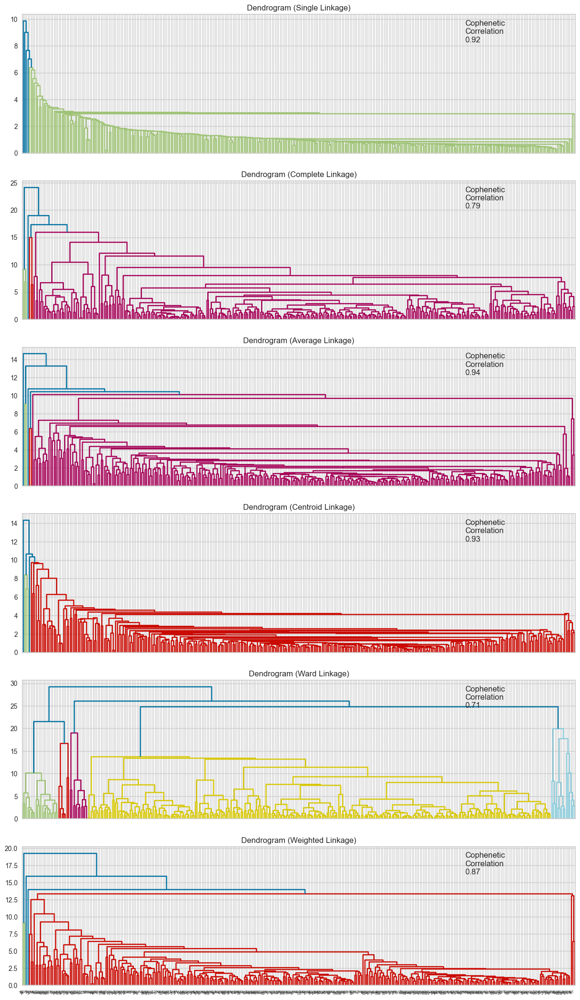

In [ ]:
# list of linkage methods
linkage_methods = ["single", "complete", "average", "centroid", "ward", "weighted"] ## the code to add linkages

# lists to save results of cophenetic correlation calculation
compare_cols = ["Linkage", "Cophenetic Coefficient"]
compare = []

# to create a subplot image
fig, axs = plt.subplots(len(linkage_methods), 1, figsize=(15, 30))

# We will enumerate through the list of linkage methods above
# For each linkage method, we will plot the dendrogram and calculate the cophenetic correlation
for i, method in enumerate(linkage_methods):
    Z = linkage(hc_df, metric="euclidean", method=method)

    dendrogram(Z, ax=axs[i])
    axs[i].set_title(f"Dendrogram ({method.capitalize()} Linkage)")

    coph_corr, coph_dist = cophenet(Z, pdist(hc_df))
    axs[i].annotate(
        f"Cophenetic\nCorrelation\n{coph_corr:0.2f}",
        (0.80, 0.80),
        xycoords="axes fraction",
    )

    compare.append([method, coph_corr])

# Rotate x-axis labels
fig.autofmt_xdate()

# Show the plot
plt.show()

In [ ]:
# create and print a dataframe to compare cophenetic correlations for different linkage methods
df_cc = pd.DataFrame(compare, columns=compare_cols)
df_cc = df_cc.sort_values(by="Cophenetic Coefficient")
df_cc

,Linkage,Cophenetic Coefficient
4,ward,0.710118
1,complete,0.787328
5,weighted,0.869378
0,single,0.923227
3,centroid,0.931401
2,average,0.942254


**Function to know the number of clusters for creating final model from the Dendogram(Average linkage)**

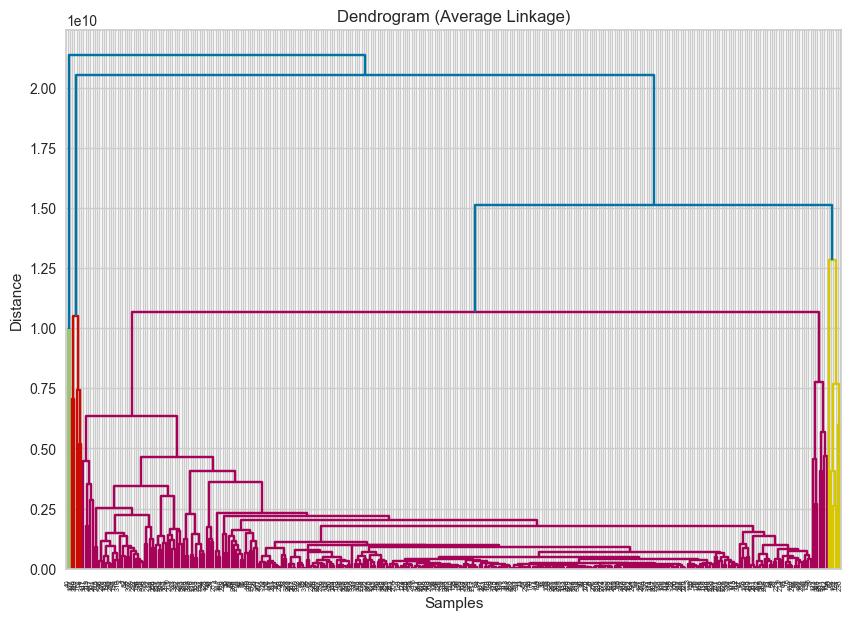

Number of clusters: 3, Silhouette Score: 0.8353249532142251
Number of clusters: 4, Silhouette Score: 0.8041527371242077
Number of clusters: 5, Silhouette Score: 0.7813024450623188
Number of clusters: 6, Silhouette Score: 0.7369040520324459
Number of clusters: 7, Silhouette Score: 0.7367967950531822
Number of clusters: 8, Silhouette Score: 0.7340269021112511
Number of clusters: 9, Silhouette Score: 0.6640572858954593

Best number of clusters: 3 with a Silhouette Score of 0.8353249532142251
    Ticker Symbol                 Security             GICS Sector  \
0             AAL  American Airlines Group             Industrials   
1            ABBV                   AbbVie             Health Care   
2             ABT      Abbott Laboratories             Health Care   
3            ADBE        Adobe Systems Inc  Information Technology   
4             ADI     Analog Devices, Inc.  Information Technology   
..            ...                      ...                     ...   
335          YHO

In [ ]:
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

# Select only numerical columns
numerical_data = data.select_dtypes(include=[np.number])

# Generate the linkage matrix using average linkage
Z = linkage(numerical_data, method='average', metric='euclidean')

# Plot the dendrogram
plt.figure(figsize=(10, 7))
dendrogram(Z)
plt.title('Dendrogram (Average Linkage)')
plt.xlabel('Samples')
plt.ylabel('Distance')
plt.show()

# Determine the best number of clusters using Silhouette Score
best_num_clusters = 0
best_silhouette_score = -1
results = []

for num_clusters in range(3, 10):
    clusters = fcluster(Z, num_clusters, criterion='maxclust')
    silhouette_avg = silhouette_score(numerical_data, clusters)
    results.append((num_clusters, silhouette_avg))

    if silhouette_avg > best_silhouette_score:
        best_silhouette_score = silhouette_avg
        best_num_clusters = num_clusters

# Print the results
for num_clusters, sil_score in results:
    print(f"Number of clusters: {num_clusters}, Silhouette Score: {sil_score}")

print(f'\nBest number of clusters: {best_num_clusters} with a Silhouette Score of {best_silhouette_score}')

# Assign the best cluster labels to the data
final_clusters = fcluster(Z, best_num_clusters, criterion='maxclust')
data['Cluster'] = final_clusters

print(data)



**The best number of clusters from Dendogram(Average linkage) is 3.**

 **Creating model using sklearn**

**We shall create 3 clusters**

In [ ]:
%%time

HCmodel = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='average')  ## define the hierarchical clustering model
HCmodel.fit(hc_df)

CPU times: total: 0 ns
Wall time: 6.5 ms


AgglomerativeClustering(affinity='euclidean', linkage='average', n_clusters=3)

In [ ]:
# creating a copy of the original data
df2 = df.copy()

# adding hierarchical cluster labels to the original and scaled dataframes
hc_df["HC_Clusters"] = HCmodel.labels_
df2["HC_Clusters"] = HCmodel.labels_

### Cluster Profiling

In [ ]:
hc_cluster_profile = df2.groupby("HC_Clusters").mean()  ## the code to groupby the cluster labels

In [ ]:
hc_cluster_profile["count_in_each_segment"] = (
    df2.groupby("HC_Clusters")["Security"].count().values  ## the code to groupby the cluster labels
)

In [ ]:
hc_cluster_profile.style.highlight_max(color="lightgreen", axis=0)

,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio,Percentage,count_in_each_segment
HC_Clusters,,,,,,,,,,,,,
0,77.653642,4.184271,1.515129,35.103858,69.798220,68662246.290801,1613508620.178041,2.900905,578930419.447478,32.466828,-1.739711,0.292027,337
1,1274.949951,3.190527,1.268340,29.000000,184.000000,-1671386000.000000,2551360000.000000,50.090000,50935516.070000,25.453183,-1.052429,0.244461,1
2,24.485001,-13.351992,3.482611,802.000000,51.000000,-1292500000.000000,-19106500000.000000,-41.815000,519573983.250000,60.748608,1.565141,0.671241,2


In [ ]:
# Assuming 'HC_Clusters' column has cluster labels and 'Security' column has company names
for cluster in df2["HC_Clusters"].unique():
    print(f"In cluster {cluster}, the following companies are present:")
    print(df2[df2["HC_Clusters"] == cluster]["Security"].unique())
    print()

In cluster 0, the following companies are present:
['American Airlines Group' 'AbbVie' 'Abbott Laboratories'
 'Adobe Systems Inc' 'Analog Devices, Inc.' 'Archer-Daniels-Midland Co'
 'Alliance Data Systems' 'Ameren Corp' 'American Electric Power'
 'AFLAC Inc' 'American International Group, Inc.'
 'Apartment Investment & Mgmt' 'Assurant Inc' 'Arthur J. Gallagher & Co.'
 'Akamai Technologies Inc' 'Albemarle Corp' 'Alaska Air Group Inc'
 'Allstate Corp' 'Allegion' 'Alexion Pharmaceuticals'
 'Applied Materials Inc' 'AMETEK Inc' 'Affiliated Managers Group Inc'
 'Amgen Inc' 'Ameriprise Financial' 'American Tower Corp A'
 'Amazon.com Inc' 'AutoNation Inc' 'Anthem Inc.' 'Aon plc'
 'Anadarko Petroleum Corp' 'Amphenol Corp' 'Arconic Inc'
 'Activision Blizzard' 'AvalonBay Communities, Inc.' 'Broadcom'
 'American Water Works Company Inc' 'American Express Co' 'Boeing Company'
 'Bank of America Corp' 'Baxter International Inc.' 'BB&T Corporation'
 'Bard (C.R.) Inc.' 'Baker Hughes Inc' 'BIOGEN IDEC I

In [ ]:
df2.groupby(["HC_Clusters", "GICS Sector"])['Security'].count()

HC_Clusters  GICS Sector                
0            Consumer Discretionary         39
             Consumer Staples               19
             Energy                         28
             Financials                     49
             Health Care                    40
             Industrials                    53
             Information Technology         33
             Materials                      20
             Real Estate                    27
             Telecommunications Services     5
             Utilities                      24
1            Consumer Discretionary          1
2            Energy                          2
Name: Security, dtype: int64

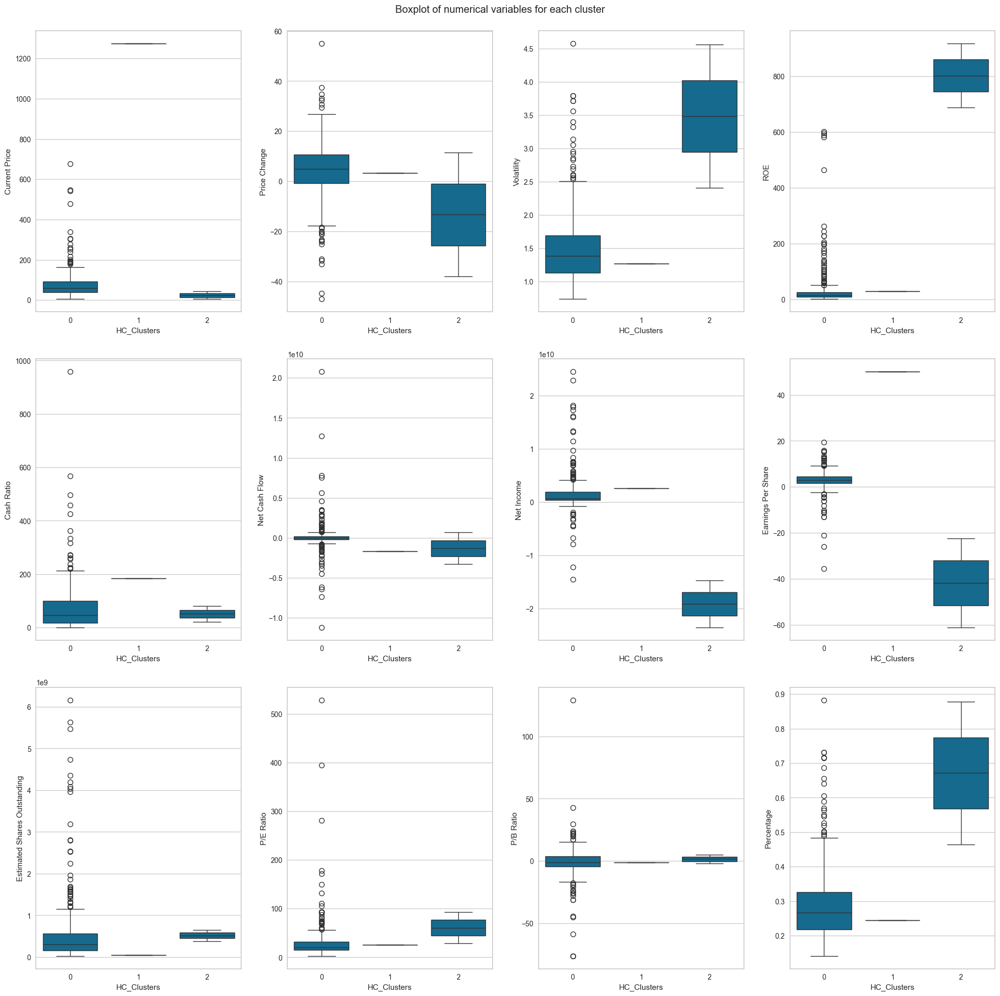

In [ ]:
plt.figure(figsize=(20, 20))
plt.suptitle("Boxplot of numerical variables for each cluster")

for i, variable in enumerate(num_col):
    plt.subplot(3, 4, i + 1)
    sns.boxplot(data=df2, x="HC_Clusters", y=variable)

plt.tight_layout(pad=2.0)

In [ ]:
df2 = pd.DataFrame(data)

# Add the cluster column
df2['HC_Clusters'] = np.random.choice([0, 1, 2], size=340)  # Create 3 clusters

# Select only numerical columns
num_columns = df2.select_dtypes(include=[np.number]).columns.tolist()

# Function to generate concise summary for each cluster
def summarize_clusters(df2, clusters_col, num_columns):
    summary = {}
    for cluster in df2[clusters_col].unique():
        summary[cluster] = {}
        cluster_data = df2[df2[clusters_col] == cluster]

        for column in num_columns:
            if column == clusters_col:
                continue
            col_data = cluster_data[column]
            summary[cluster][column] = {
                'Median': col_data.median(),
                'Mean': col_data.mean(),
                'Std Dev': col_data.std(),
                'Min': col_data.min(),
                'Max': col_data.max(),
                'Q1': col_data.quantile(0.25),
                'Q3': col_data.quantile(0.75)
            }
    return summary

# Generate summary
cluster_summary = summarize_clusters(df2, "HC_Clusters", num_columns)

# Print summary for each cluster
for cluster, variables in cluster_summary.items():
    print(f"\nCluster {cluster} Summary:")
    for variable, stats in variables.items():
        print(f"- {variable}:")
        for stat, value in stats.items():
            print(f"  {stat}: {value}")


Cluster 1 Summary:
- Current Price:
  Median: 60.599998
  Mean: 77.54746481241177
  Std Dev: 74.80487948024722
  Min: 6.77
  Max: 675.890015
  Q1: 39.3600005
  Q3: 89.9899975
- Price Change:
  Median: 5.796884441
  Mean: 3.475594778361344
  Std Dev: 12.140603575741265
  Min: -44.79813665
  Max: 32.2681047
  Q1: -1.5072093495
  Q3: 10.730447525
- Volatility:
  Median: 1.418687807
  Mean: 1.5722534533781514
  Std Dev: 0.63454140283054
  Min: 0.806055969
  Max: 4.58004173
  Q1: 1.158901691
  Q3: 1.6995553945
- ROE:
  Median: 16.0
  Mean: 41.705882352941174
  Std Dev: 85.05355769730679
  Min: 1
  Max: 601
  Q1: 10.0
  Q3: 29.0
- Cash Ratio:
  Median: 47.0
  Mean: 74.81512605042016
  Std Dev: 88.38187236353379
  Min: 0
  Max: 568
  Q1: 18.5
  Q3: 99.0
- Net Cash Flow:
  Median: 7194000.0
  Mean: 361520042.0168067
  Std Dev: 2574774105.8541307
  Min: -6430000000
  Max: 20764000000
  Q1: -226850000.0
  Q3: 272799500.0
- Net Income:
  Median: 633700000.0
  Mean: 953135739.4957983
  Std Dev: 3

## K-means vs Hierarchical Clustering

## Actionable Insights and Recommendations

___